In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
import multiprocessing
from torch import autograd
from fastai.conv_learner import *
from fasterai.images import *
from fasterai.dataset import *
from fasterai.visualize import *
from fastai.torch_imports import *
from pathlib import Path
from itertools import repeat
import tensorboardX
torch.cuda.set_device(0)
plt.style.use('dark_background')
torch.backends.cudnn.benchmark=True


/home/jason/anaconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jason/anaconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jason/anaconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [3]:
DATA_PATH = Path('data/imagenet/ILSVRC/Data/CLS-LOC')
TRAIN_SOURCE_PATH = DATA_PATH/'train'
uid = 'bw2color'
D_MODEL_SAVE_PATH = DATA_PATH/(uid + '_90_D.h5')
G_MODEL_SAVE_PATH = DATA_PATH/(uid + '_90_G.h5')
#keep_pct=0.02
keep_pct=1.0
#keep_pct=0.005
#keep_pct=1.0

In [4]:
def get_model_data(image_size: int, batch_size: int, keep_pct: float):
    TRAIN_X_PATH = generate_image_preprocess_path(TRAIN_SOURCE_PATH, is_x=True, size=image_size, uid=uid)
    TRAIN_Y_PATH = generate_image_preprocess_path(TRAIN_SOURCE_PATH, is_x=False, size=image_size, uid=uid)
    x_paths, y_paths = get_matched_xy_file_lists(TRAIN_X_PATH, TRAIN_Y_PATH)
    x_paths_str = convert_paths_to_str(x_paths)
    y_paths_str = convert_paths_to_str(y_paths)
    print(x_paths_str[:5])
    print(y_paths_str[:5])
    np.random.seed(42)
    keeps = np.random.rand(len(x_paths_str)) < keep_pct
    fnames_x = np.array(x_paths_str, copy=False)[keeps]
    fnames_y = np.array(y_paths_str, copy=False)[keeps]
    val_idxs = get_cv_idxs(len(fnames_x), val_pct=min(0.01/keep_pct, 0.1))
    ((val_x,trn_x),(val_y,trn_y)) = split_by_idx(val_idxs, np.array(fnames_x), np.array(fnames_y))
    img_fn = TRAIN_Y_PATH/'n01558993'/'n01558993_9684.JPEG'
    tfms = tfms_from_stats(inception_stats, image_size, tfm_y=TfmType.PIXEL, aug_tfms=transforms_side_on, sz_y=image_size)
    datasets = ImageData.get_ds(MatchedFilesDataset, (trn_x,trn_y), (val_x,val_y), tfms, path=TRAIN_Y_PATH.parent)
    md = ImageData(DATA_PATH, datasets, batch_size, num_workers=16, classes=None)
    return md

In [5]:
md = get_model_data(image_size=224, batch_size=128, keep_pct=keep_pct)
denorm = md.val_ds.denorm

['train_x_bw2color_224/n01440764/n01440764_10026.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10027.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10029.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10040.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10042.JPEG']
['train_y_bw2color_224/n01440764/n01440764_10026.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10027.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10029.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10040.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10042.JPEG']


In [6]:
def generate_denormed_image_pairs(ds: FilesDataset, batches: [(ndarray,ndarray)], idx:int = 0):
    return [(ds.denorm(x)[idx], ds.denorm(y)[idx])for (x,y) in batches]

## EDSR Model

##### TODO:  Also try making the loss/output based on "classification" like in Zhang et al.
##### TODO:  After making unet version- plug that into a Weiserman GAN setup (the discrimator looks at grey image and colorized image, concatenated together via channels).
##### TODO:  Try using higher res images (from FloydHub blog?)
##### TODO:  Try perceptual loss again....
##### TODO:  To convert real old photos, could force them to normal grayscale first.
##### TODO:  Add tensorboard graphs

In [7]:
def icnr(x, scale=2, init=nn.init.kaiming_normal):
    new_shape = [int(x.shape[0] / (scale ** 2))] + list(x.shape[1:])
    subkernel = torch.zeros(new_shape)
    subkernel = init(subkernel)
    subkernel = subkernel.transpose(0, 1)
    subkernel = subkernel.contiguous().view(subkernel.shape[0],
                                            subkernel.shape[1], -1)
    kernel = subkernel.repeat(1, 1, scale ** 2)
    transposed_shape = [x.shape[1]] + [x.shape[0]] + list(x.shape[2:])
    kernel = kernel.contiguous().view(transposed_shape)
    kernel = kernel.transpose(0, 1)
    return kernel

In [8]:
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): 
        self.features = output
    def remove(self): 
        self.hook.remove()

In [9]:
class FeatureLoss(nn.Module):
    def __init__(self, block_wgts: [float] = [0.2,0.7,0.1]):
        super().__init__()
        m_vgg = vgg16(True)
        
        blocks = [i-1 for i,o in enumerate(children(m_vgg))
              if isinstance(o,nn.MaxPool2d)]
        blocks, [m_vgg[i] for i in blocks]
        layer_ids = blocks[:3]
        
        vgg_layers = children(m_vgg)[:23]
        m_vgg = nn.Sequential(*vgg_layers).cuda().eval()
        set_trainable(m_vgg, False)
        
        self.m,self.wgts = m_vgg,block_wgts
        self.sfs = [SaveFeatures(m_vgg[i]) for i in layer_ids]

    def forward(self, input, target, sum_layers=True):
        self.m(VV(target.data))
        res = [F.l1_loss(input,target)/100]
        targ_feat = [V(o.features.data.clone()) for o in self.sfs]
        self.m(input)
        res += [F.l1_loss(self.flatten(inp.features),self.flatten(targ))*wgt
               for inp,targ,wgt in zip(self.sfs, targ_feat, self.wgts)]
        if sum_layers: res = sum(res)
        return res
    
    def flatten(self, x): 
        return x.view(x.size(0), -1)
    
    def close(self):
        for o in self.sfs: o.remove()

In [10]:
def conv(ni, nf, kernel_size=3, actn=False, stride=1, normalizer=None):
    layers = [nn.Conv2d(ni, nf, kernel_size, padding=kernel_size//2, stride=stride)]
    if normalizer is not None: layers.append(normalizer)
    if actn: layers.append(nn.LeakyReLU())
    return nn.Sequential(*layers)

In [11]:
class UpSampleBlock(nn.Module):
    def __init__(self, ni, nf, scale=2):
        super().__init__()
        layers = []
        for i in range(int(math.log(scale,2))):
            layers += [conv(ni, nf*4), nn.PixelShuffle(2)]
        self.sequence = nn.Sequential(*layers)
        self.icnr_init()
        
    def icnr_init(self):
        conv_shuffle = self.sequence[0][0]
        kernel = icnr(conv_shuffle.weight)
        conv_shuffle.weight.data.copy_(kernel);
    
    def forward(self, x):
        return self.sequence(x)

In [12]:
class ResSequential(nn.Module):
    def __init__(self, layers, res_scale=1.0):
        super().__init__()
        self.res_scale = res_scale
        self.m = nn.Sequential(*layers)

    def forward(self, x): return x + self.m(x) * self.res_scale

In [13]:
def res_block(nf):
    return ResSequential(
        [conv(nf, nf, actn=True), conv(nf, nf)], 0.1)

In [14]:
class ImageModifierModel(nn.Module):
    @staticmethod
    def generate_base_model():
        f = resnet34
        cut,lr_cut = model_meta[f]
        layers = cut_model(f(True), cut)
        return nn.Sequential(*layers), lr_cut
    
    @staticmethod
    def generate_residual_block(nf):
        return ResSequential(
            [nn.BatchNorm2d(nf), 
             conv(nf, nf, actn=True), 
             nn.BatchNorm2d(nf),
             conv(nf, nf, actn=True)])

    def set_trainable(self, trainable):
        set_trainable(self, trainable)
        set_trainable(self.rn, False)
        
    
    def __init__(self, nf_up=32, nf_mid=64):
        super().__init__() 
        rn, lr_cut = ImageModifierModel.generate_base_model()
        self.rn = rn
        set_trainable(rn, False)
        self.lr_cut = lr_cut
        self.sfs = [SaveFeatures(rn[i]) for i in [2,4,5,6]]
        
        self.up1 = nn.Sequential(*[UpSampleBlock(256,nf_up, 2), UpSampleBlock(nf_up,nf_up, 8)])  #256 in
        self.up2 = nn.Sequential(*[UpSampleBlock(128, nf_up, 2), UpSampleBlock(nf_up,nf_up, 4)])  #128 in
        self.up3 = nn.Sequential(*[UpSampleBlock(64,nf_up), UpSampleBlock(nf_up,nf_up, 2)])    #64 in
        self.up4 = UpSampleBlock(64, nf_up)   #64 in  
        
        mid_layers = []
        mid_layers += [conv(nf_up * 4,nf_mid), nn.BatchNorm2d(nf_mid)]
        for i in range(8): mid_layers.append(ImageModifierModel.generate_residual_block(nf_mid))
        mid_layers += [nn.BatchNorm2d(nf_mid), conv(nf_mid, 3, kernel_size=1)]
        self.upconv = nn.Sequential(*mid_layers)
             
        out_layers = []
        out_layers += [conv(6, 3, kernel_size=1)]
        self.out = nn.Sequential(*out_layers)
        
    def forward(self, x): 
        self.rn(x)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        x5 = self.upconv(torch.cat([x1, x2, x3, x4], dim=1))
        #x5 = self.upconv(torch.cat([x2, x3, x4], dim=1))
        return F.tanh(self.out(torch.cat([x, x5], dim=1)))

## WGAN Critic Model

In [15]:
class ConvBlock(nn.Module):
    def __init__(self, ni, no, ks, stride, bn=True, pad=None):
        super().__init__()   
        if pad is None: pad = ks//2//stride
        self.conv = nn.Conv2d(ni, no, ks, stride, padding=pad, bias=False)
        self.bn = nn.BatchNorm2d(no) if bn else None
        self.relu = nn.LeakyReLU(0.2)
    
    def forward(self, x):
        x = self.relu(self.conv(x))
        return self.bn(x) if self.bn else x

In [16]:
class Critic(nn.Module):
    
    @staticmethod
    def generate_base_model():
        f = resnet34
        cut,lr_cut = model_meta[f]
        layers = cut_model(f(True), cut)
        return nn.Sequential(*layers), lr_cut
    
    def set_trainable(self, trainable):
        set_trainable(self, trainable)
        set_trainable(self.rn, False)
    
    def __init__(self, size, nf_up, nf_mid):
        super().__init__()
 
        rn, lr_cut = ImageModifierModel.generate_base_model()
        self.rn = rn
        set_trainable(rn, False)
        self.lr_cut = lr_cut
        self.sfs = [SaveFeatures(rn[i]) for i in [2,4,5,6]]
        
        self.up1 = nn.Sequential(*[UpSampleBlock(256,nf_up, 2), UpSampleBlock(nf_up,nf_up, 8)])  #256 in
        self.up2 = nn.Sequential(*[UpSampleBlock(128, nf_up, 2), UpSampleBlock(nf_up,nf_up, 4)])  #128 in
        self.up3 = nn.Sequential(*[UpSampleBlock(64,nf_up), UpSampleBlock(nf_up,nf_up, 2)])    #64 in
        self.up4 = UpSampleBlock(64, nf_up)   #64 in  
        
        self.raw_up = nn.Sequential(*[conv(3, nf_up)])
        
        mid_layers = []
        #mid_layers += [conv(nf_up*10,nf_mid), nn.BatchNorm2d(nf_mid)]
        mid_layers += [conv(nf_up*10,nf_mid)]
        for i in range(4): mid_layers.append(res_block(nf_mid))
        #mid_layers += [nn.BatchNorm2d(nf_mid), conv(nf_mid, nf_mid)]
        mid_layers += [conv(nf_mid, nf_mid)]
        self.upconv = nn.Sequential(*mid_layers)
        
        
        pyr_layers = []
        csize = size
        cndf = nf_mid
        
        while csize > 8:
            pyr_layers.append(ConvBlock(cndf, cndf*2, 4, 2, bn=False))
            cndf *= 2; csize /= 2
        self.pyramid = nn.Sequential(*pyr_layers)
        
        self.final = nn.Conv2d(cndf, 1, 4, padding=0, bias=False)
        
    def forward(self, input, orig):
        self.rn(orig)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        orig_features =  torch.cat([x1, x2, x3, x4], dim=1)
        
        self.rn(input)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        result_features = torch.cat([x1, x2, x3, x4], dim=1)
        
        orig_up = self.raw_up(orig)
        input_up = self.raw_up(orig)
        
        combined_features = torch.cat([orig_up, input_up, orig_features, result_features], dim=1)      
        x = self.upconv(combined_features)
        x = self.pyramid(x)
        return self.final(x).mean()

In [17]:
class Critic2(nn.Module):
    @staticmethod
    def generate_base_model():
        f = resnet34
        cut,lr_cut = model_meta[f]
        layers = cut_model(f(True), cut)
        return nn.Sequential(*layers), lr_cut
    
    def set_trainable(self, trainable):
        set_trainable(self, trainable)
        set_trainable(self.rn, False)
            
    def __init__(self, nf_up, nf_mid, sz):
        super().__init__()
         
        self.nf_mid = nf_mid
        self.nf_up = nf_up
        rn, lr_cut = ImageModifierModel.generate_base_model()
        self.rn = rn
        set_trainable(self.rn, False)
        self.lr_cut = lr_cut
        self.sfs = [SaveFeatures(rn[i]) for i in [2,4,5,6]]
        
        self.up1 = nn.Sequential(*[UpSampleBlock(256,nf_up, 2), UpSampleBlock(nf_up,nf_up, 8)])  #256 in
        self.up2 = nn.Sequential(*[UpSampleBlock(128, nf_up, 2), UpSampleBlock(nf_up,nf_up, 4)])  #128 in
        self.up3 = nn.Sequential(*[UpSampleBlock(64,nf_up), UpSampleBlock(nf_up,nf_up, 2)])    #64 in
        self.up4 = UpSampleBlock(64, nf_up)   #64 in  
        self.raw_up = nn.Sequential(*[conv(3, nf_up, kernel_size=1, actn=False)])
        
        self.mid = nn.Sequential(
            nn.LayerNorm([nf_up*8 + 6, sz, sz]),
            nn.Conv2d(nf_up*8 + 6, nf_mid, 3, 2, padding=1),
            nn.LayerNorm([nf_mid, sz//2, sz//2]),
            nn.LeakyReLU(),
            nn.Conv2d(nf_mid, 2 * nf_mid, 3, 2, padding=1),
            nn.LayerNorm([2 * nf_mid, sz//4, sz//4]),
            nn.LeakyReLU(),
            nn.Conv2d(2 * nf_mid, 4 * nf_mid, 3, 2, padding=1),
            nn.LayerNorm([4 * nf_mid, sz//8, sz//8]),
            nn.LeakyReLU(),
            nn.Conv2d(4 * nf_mid, 8 * nf_mid, 3, 2, padding=1),
            nn.LayerNorm([8 * nf_mid, sz//16, sz//16]),
            nn.LeakyReLU()
        )
        

        self.out = nn.Sequential(
            nn.Conv2d(8 * nf_mid, 1, 4, padding=2)
        )
        
    def forward(self, input, orig):
        self.rn(orig)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        orig_features =  torch.cat([x1, x2, x3, x4], dim=1)
        
        self.rn(input)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        result_features = torch.cat([x1, x2, x3, x4], dim=1)
              
        combined_features = torch.cat([orig, input, orig_features, result_features], dim=1)      
        x = self.mid(combined_features)
        x = self.out(x)
        return x.mean()

In [18]:
class Critic3(nn.Module):
    @staticmethod
    def generate_base_model():
        f = resnet34
        cut,lr_cut = model_meta[f]
        layers = cut_model(f(True), cut)
        return nn.Sequential(*layers), lr_cut
    
    @staticmethod
    def generate_residual_block(nf):
        
        return ResSequential(
            [conv(nf, nf, actn=True), 
             conv(nf, nf, actn=True), 
             conv(nf, nf)])
    
    def set_trainable(self, trainable):
        set_trainable(self, trainable)
        set_trainable(self.rn, False)
            
    def __init__(self, nf_up, nf_mid):
        super().__init__()
         
        self.nf_mid = nf_mid
        self.nf_up = nf_up
        rn, lr_cut = ImageModifierModel.generate_base_model()
        self.rn = rn
        set_trainable(self.rn, False)
        self.lr_cut = lr_cut
        self.sfs = [SaveFeatures(rn[i]) for i in [2,4,5,6]]
        
        self.up1 = nn.Sequential(*[UpSampleBlock(256,nf_up, 2), UpSampleBlock(nf_up,nf_up, 8)])  #256 in
        self.up2 = nn.Sequential(*[UpSampleBlock(128, nf_up, 2), UpSampleBlock(nf_up,nf_up, 4)])  #128 in
        self.up3 = nn.Sequential(*[UpSampleBlock(64,nf_up), UpSampleBlock(nf_up,nf_up, 2)])    #64 in
        self.up4 = UpSampleBlock(64, nf_up)   #64 in  
        
        mid_layers = [] 
        mid_layers.append(conv(nf_up*8 + 6, nf_mid, kernel_size=1, actn=False))
        
        for i in range(8):
            mid_layers.append(Critic3.generate_residual_block(nf_mid))
            
        self.mid = nn.Sequential(*mid_layers)

        self.out = nn.Sequential(
            nn.Conv2d(nf_mid, 1, 4, padding=2)
        )
        
    def forward(self, input, orig):
        self.rn(orig)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        orig_features =  torch.cat([x1, x2, x3, x4], dim=1)
        
        self.rn(input)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        result_features = torch.cat([x1, x2, x3, x4], dim=1)
             
        x = torch.cat([orig, input, orig_features, result_features], dim=1)      
        x = self.mid(x)
        x = self.out(x)
        return x.mean()

In [19]:
class Critic4(nn.Module):
    @staticmethod
    def generate_residual_block(nf):
        return ResSequential(
            [conv(nf, nf, actn=True), 
             conv(nf, nf, actn=True), 
             conv(nf, nf)])
    
    def set_trainable(self, trainable):
        set_trainable(self, trainable)
            
    def __init__(self, nf):
        super().__init__()
     
        self.mid = nn.Sequential(
            nn.Conv2d(6, nf, 3, 2, padding=1),
            nn.LeakyReLU(),
            nn.Conv2d(nf, 2 * nf, 3, 2, padding=1),
            nn.LeakyReLU(),
            nn.Conv2d(2 * nf, 4 * nf, 3, 2, padding=1),
            nn.LeakyReLU(),
            nn.Conv2d(4 * nf, 8 * nf, 3, 2, padding=1),
            nn.LeakyReLU()
        )

        self.out = nn.Sequential(
            nn.Conv2d(8 * nf, 1, 4, padding=2)
        )
        
    def forward(self, input, orig):      
        x = torch.cat([orig, input], dim=1)      
        x = self.mid(x)
        x = self.out(x)
        return x.mean()

## Training

In [20]:
#def train(lrs, session_num: int, cycle_len=2, use_clr_beta=(20,10,0.95,0.85)):
#    if session_num > 0:
#        learn.load(uid + '_224_' + str(session_num - 1))
#    learn.fit(lrs, 1, cycle_len=cycle_len, wds=wd, use_clr_beta=use_clr_beta)
#    learn.save(uid + '_224_' + str(session_num))

In [21]:
def visualize(md: ImageData, model: nn.Module, start_idx: int, count: int, figsize=(20,20), max_columns=4):
    end_index = start_idx + count
    idxs = list(range(start_idx,end_index))
    #plot_image_outputs_from_model(md.val_ds, model, list(range(start_idx,end_index)), figsize=figsize, max_columns=max_columns)
    
    image_pairs = []
    ds = md.val_ds

    for idx in idxs:
        x,_=ds[idx]
        preds = model(VV(x[None]))
        image_pairs.append((ds.denorm(x[None])[0], ds.denorm(preds)[0]))
        
    num_pairs = len(image_pairs)
    num_images = num_pairs * 2
    rows, columns = get_num_rows_columns(num_images, max_columns)

    fig, axes = plt.subplots(rows, columns, figsize=figsize)
    for i,(x,y) in enumerate(image_pairs):
        plot_image_from_ndarray(x, axes=axes.flat[i*2])
        plot_image_from_ndarray(y, axes=axes.flat[i*2+1])
        
    display(fig)

In [22]:
wd=1e-7
bs = 16
sz = 128
md = get_model_data(image_size=sz, batch_size=bs, keep_pct=keep_pct)

netG = ImageModifierModel(nf_up=32, nf_mid=64).cuda()
#load_model(netG, G_MODEL_SAVE_PATH)
netD = Critic2(32, 128, sz).cuda()
#load_model(netD, D_MODEL_SAVE_PATH)

['train_x_bw2color_128/n01440764/n01440764_10026.JPEG', 'train_x_bw2color_128/n01440764/n01440764_10027.JPEG', 'train_x_bw2color_128/n01440764/n01440764_10029.JPEG', 'train_x_bw2color_128/n01440764/n01440764_10040.JPEG', 'train_x_bw2color_128/n01440764/n01440764_10042.JPEG']
['train_y_bw2color_128/n01440764/n01440764_10026.JPEG', 'train_y_bw2color_128/n01440764/n01440764_10027.JPEG', 'train_y_bw2color_128/n01440764/n01440764_10029.JPEG', 'train_y_bw2color_128/n01440764/n01440764_10040.JPEG', 'train_y_bw2color_128/n01440764/n01440764_10042.JPEG']


/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  after removing the cwd from sys.path.
/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  after removing the cwd from sys.path.
/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  after removing the cwd from sys.path.
/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  after removing the cwd from sys.path.
/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.kaiming_normal is no

In [23]:
#optimizerD = optim.RMSprop(filter(lambda p: p.requires_grad,netD.parameters()), lr = 1e-4)
#optimizerG = optim.RMSprop(filter(lambda p: p.requires_grad,netG.parameters()), lr = 1e-4)

#optimizerD = optim.RMSprop(filter(lambda p: p.requires_grad,netD.parameters()), lr = 1e-3)
#optimizerG = optim.RMSprop(filter(lambda p: p.requires_grad,netG.parameters()), lr = 1e-3)

#TODO:  Weird beta 1 value, but we'll see...
optimizerD = optim.RMSprop(filter(lambda p: p.requires_grad,netD.parameters()), lr=1e-4)
optimizerG = optim.Adam(filter(lambda p: p.requires_grad,netG.parameters()), lr=1e-4, betas=(0.5, 0.9))

In [24]:
def calc_gradient_penalty(netD, real_data, fake_data, orig_data):
    lamda = 10 # Gradient penalty lambda hyperparameter
    # print "real_data: ", real_data.size(), fake_data.size()
    alpha = torch.rand(bs, 1)
    alpha = alpha.expand(bs, real_data.nelement()//bs).contiguous().view(bs, 3, sz, sz)
    alpha = alpha.cuda()
    differences = fake_data - real_data
    interpolates = real_data + (alpha*differences)
    interpolates = interpolates.cuda()
    interpolates = autograd.Variable(interpolates, requires_grad=True)
    disc_interpolates = netD(interpolates, orig_data)
    gradients = autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                              grad_outputs=torch.ones(disc_interpolates.size()).cuda(),
                              create_graph=True, retain_graph=True, only_inputs=True)[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean() * lamda
    return gradient_penalty

In [25]:
def train(niter, first=True):
    gen_iterations = 0
    for epoch in trange(niter):
        netD.train(); netG.train()
        data_iter = iter(md.trn_dl)
        i,n = 0,len(md.trn_dl)
        n = n-(n%bs)
        with tqdm(total=n) as pbar:
            while i < n:
                netD.set_trainable(True)
                netG.set_trainable(False)
                #d_iters = 300 if (first and (gen_iterations < 50) or (gen_iterations % 1000 == 0)) else 15
                d_iters = 100 if (first and (gen_iterations < 25) or (gen_iterations % 500 == 0)) else 5
                #d_iters = 1000 if (first and (gen_iterations < 25) or (gen_iterations % 500 == 0)) else 50
                j = 0
                while (j < d_iters) and (i < n):
                    j += 1; i += 1
                    #or p in netD.parameters(): p.data.clamp_(-0.01, 0.01)
                    x, y = next(data_iter)
                    orig_image = V(x)
                    real_image = V(y)                        
                    #Higher == Real
                    disc_real = netD(real_image, orig_image)
                    fake_image = netG(orig_image)
                    disc_fake = netD(V(fake_image.data), orig_image)
                    netD.zero_grad()
                          
                    gradient_penalty = calc_gradient_penalty(netD, real_image.data, fake_image.data, orig_image)              
                    disc_cost = disc_fake - disc_real + gradient_penalty
                    w_dist = disc_fake - disc_real
                    disc_cost.backward()
                    optimizerD.step()
                    pbar.update()

                    
                netD.set_trainable(False)
                netG.set_trainable(True)
                netG.zero_grad()
                
                x, y = next(data_iter)
                orig_image = V(x)
                real_image = V(y)   
                fake_image = netG(orig_image)
                gen_mse_cost = F.mse_loss(fake_image, real_image) * 5000
                gen_cost  = -netD(fake_image, orig_image) + gen_mse_cost
                gen_cost .backward()
                optimizerG.step()
                gen_iterations += 1
                
                if i % 50 == 0:
                    print(f'\nWDist {to_np(w_dist)}; GPenalty {to_np(gradient_penalty)}; RScore {to_np(disc_real)};'
                          + ' FScore {to_np(disc_fake)}; GLoss {to_np(gen_cost)}; MSELoss {to_np(gen_mse_cost)}')
                
                if i % 500 == 0:
                    visualize(md, netG, 500, 8)
                    save_model(netD, D_MODEL_SAVE_PATH)
                    save_model(netG, G_MODEL_SAVE_PATH)

In [26]:
torch.backends.cudnn.benchmark=True

  0%|          | 100/79264 [01:10<14:57:22,  1.47it/s]
WDist -231.953125; GPenalty 5.681881904602051; RScore 103.9805679321289; FScore -127.9725570678711; GLoss 2452.19384765625
  0%|          | 200/79264 [02:22<14:59:39,  1.46it/s]
WDist -444.9554443359375; GPenalty 4.44556188583374; RScore 223.22998046875; FScore -221.72544860839844; GLoss 2232.4697265625
  0%|          | 300/79264 [03:31<15:00:29,  1.46it/s]
WDist -603.5562133789062; GPenalty 88.56790161132812; RScore 306.9836120605469; FScore -296.5726013183594; GLoss 2035.4871826171875
  1%|          | 400/79264 [04:42<14:59:17,  1.46it/s]
WDist -758.8160400390625; GPenalty 1.8803973197937012; RScore 388.2772521972656; FScore -370.53875732421875; GLoss 2252.40625
  1%|          | 500/79264 [05:54<14:58:43,  1.46it/s]
WDist -896.625732421875; GPenalty 3.288559675216675; RScore 463.74468994140625; FScore -432.88104248046875; GLoss 2173.314453125


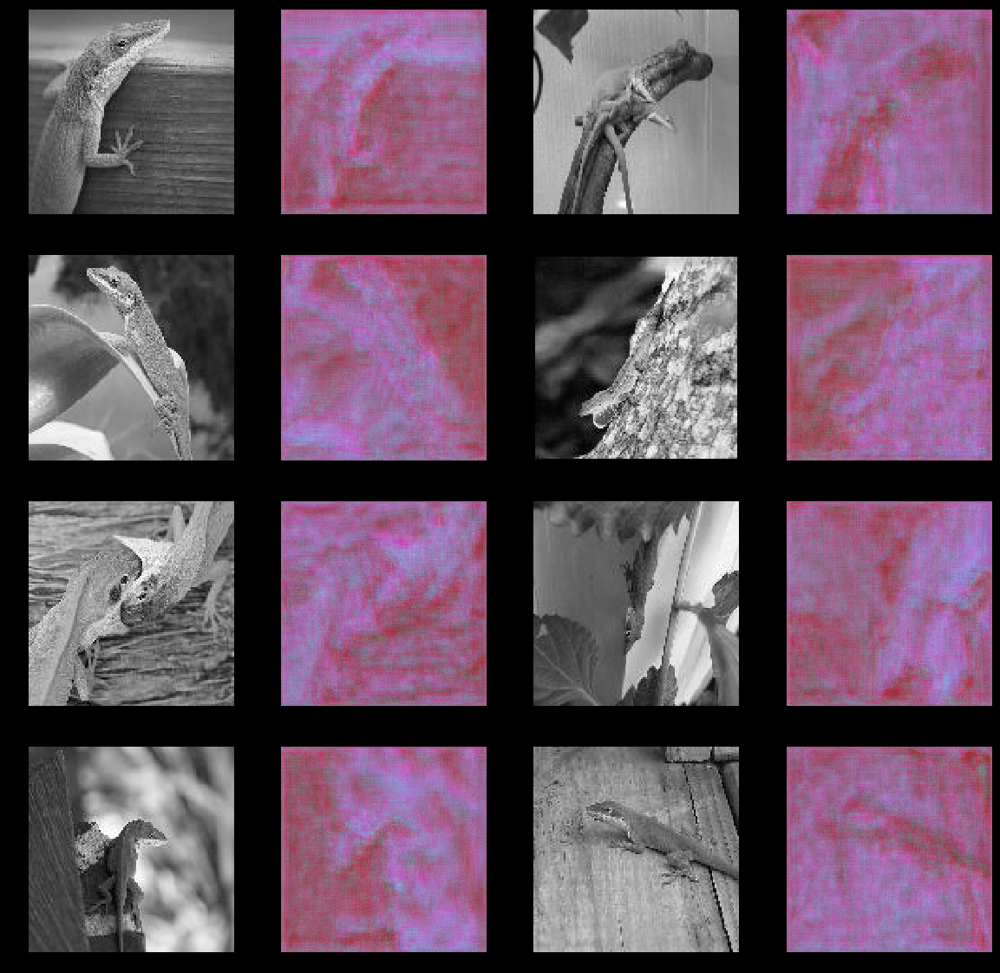

  1%|          | 600/79264 [07:59<14:56:42,  1.46it/s]
WDist -1035.5299072265625; GPenalty 20.653976440429688; RScore 533.6930541992188; FScore -501.83685302734375; GLoss 2018.730712890625
  1%|          | 700/79264 [09:10<14:54:52,  1.46it/s]
WDist -1221.571044921875; GPenalty 12.74533748626709; RScore 629.9337158203125; FScore -591.6372680664062; GLoss 2151.898193359375
  1%|          | 800/79264 [10:22<16:50:11,  1.29it/s]
WDist -1259.524169921875; GPenalty 182.13975524902344; RScore 593.521240234375; FScore -666.0029296875; GLoss 2184.64501953125
  1%|          | 900/79264 [11:30<14:55:42,  1.46it/s]
WDist -1538.2037353515625; GPenalty 3.470832109451294; RScore 793.7439575195312; FScore -744.4597778320312; GLoss 2143.92919921875
  1%|▏         | 1000/79264 [12:40<14:54:56,  1.46it/s]
WDist -1719.76220703125; GPenalty 2.838223934173584; RScore 889.5971069335938; FScore -830.1651000976562; GLoss 2447.4560546875


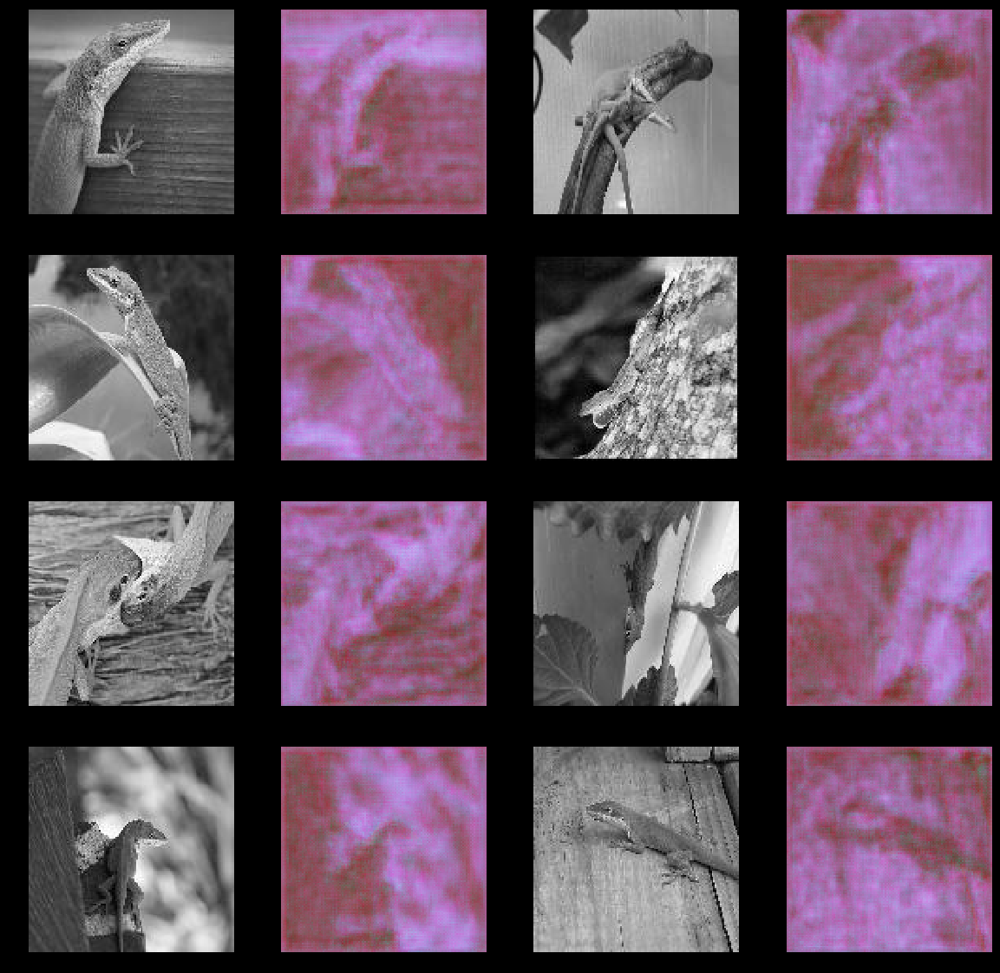

  1%|▏         | 1100/79264 [13:53<14:53:39,  1.46it/s]
WDist -1896.8394775390625; GPenalty 18.450786590576172; RScore 981.7373657226562; FScore -915.1021118164062; GLoss 2181.041259765625
  2%|▏         | 1200/79264 [15:04<14:51:40,  1.46it/s]
WDist -2069.717529296875; GPenalty 1.4105241298675537; RScore 1071.7220458984375; FScore -997.9955444335938; GLoss 2296.857666015625
  2%|▏         | 1300/79264 [16:15<14:48:08,  1.46it/s]
WDist -2257.274658203125; GPenalty 2.3936779499053955; RScore 1169.22998046875; FScore -1088.044677734375; GLoss 2523.5478515625
  2%|▏         | 1400/79264 [17:24<14:50:04,  1.46it/s]
WDist -2439.54443359375; GPenalty 3.062779426574707; RScore 1265.003662109375; FScore -1174.5408935546875; GLoss 2372.64306640625
  2%|▏         | 1500/79264 [18:34<14:47:31,  1.46it/s]
WDist -2622.05419921875; GPenalty 3.0941967964172363; RScore 1360.323486328125; FScore -1261.7308349609375; GLoss 2618.4130859375


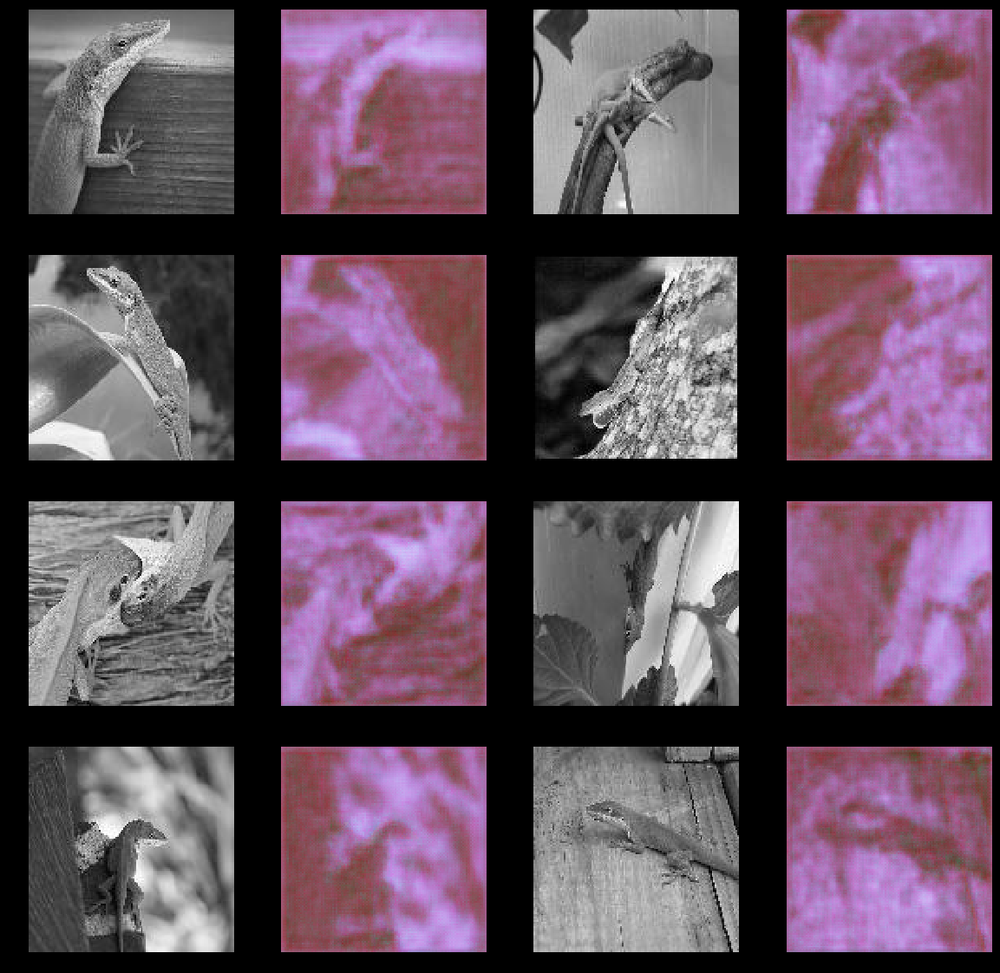

  2%|▏         | 1600/79264 [19:57<14:51:26,  1.45it/s]
WDist -2808.80126953125; GPenalty 2.9273715019226074; RScore 1458.616455078125; FScore -1350.184814453125; GLoss 2837.44921875
  2%|▏         | 1700/79264 [21:06<14:46:36,  1.46it/s]
WDist -3008.66015625; GPenalty 2.584928512573242; RScore 1562.2916259765625; FScore -1446.368408203125; GLoss 2909.70849609375
  2%|▏         | 1800/79264 [22:19<14:47:06,  1.46it/s]
WDist -3221.3037109375; GPenalty 4.159759521484375; RScore 1673.4949951171875; FScore -1547.808837890625; GLoss 2843.6220703125
  2%|▏         | 1900/79264 [23:28<14:43:43,  1.46it/s]
WDist -3419.80810546875; GPenalty 3.53684663772583; RScore 1775.4322509765625; FScore -1644.3759765625; GLoss 3068.49951171875
  3%|▎         | 2000/79264 [24:41<14:44:09,  1.46it/s]
WDist -3641.485107421875; GPenalty 5.750494480133057; RScore 1893.72607421875; FScore -1747.759033203125; GLoss 2930.218505859375


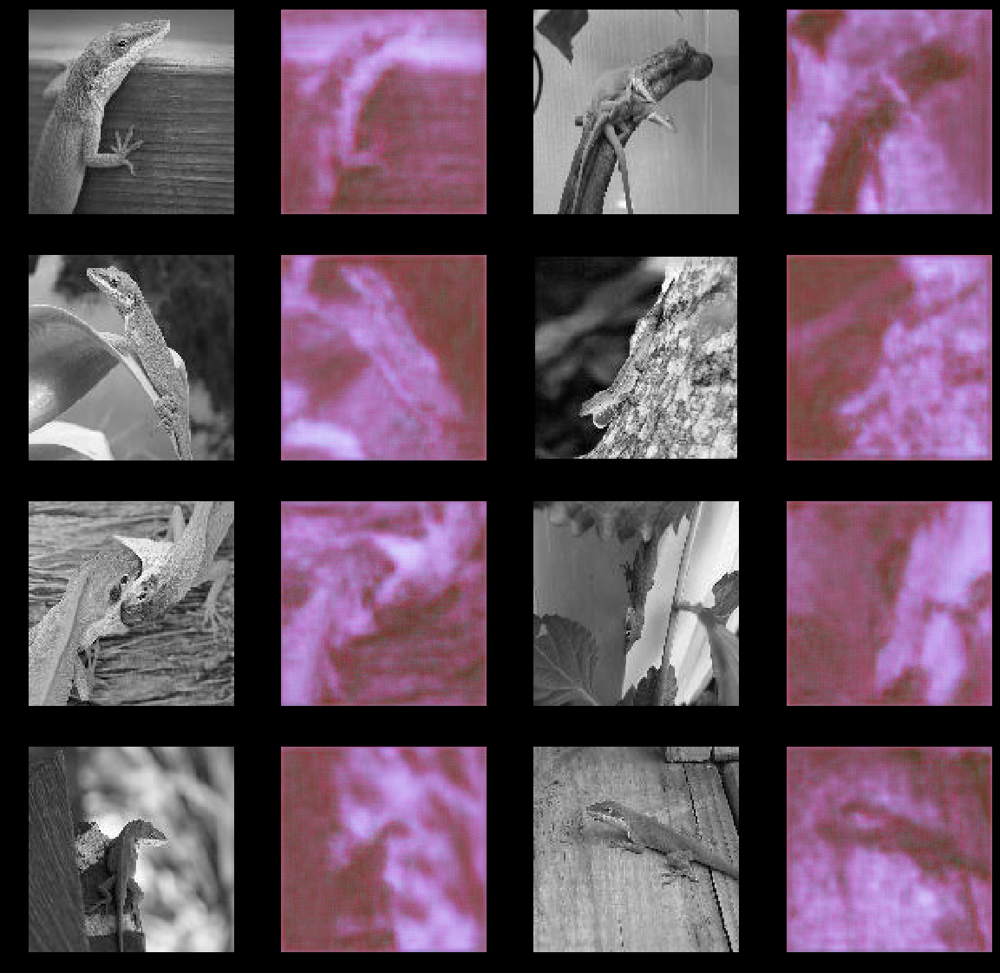

  3%|▎         | 2100/79264 [25:57<14:44:13,  1.45it/s]
WDist -810.3287353515625; GPenalty 7.358173370361328; RScore 1985.6429443359375; FScore 1175.314208984375; GLoss 3321.452880859375
  3%|▎         | 2200/79264 [27:06<14:40:11,  1.46it/s]
WDist -4053.619873046875; GPenalty 2.2692792415618896; RScore 2110.02978515625; FScore -1943.590087890625; GLoss 3302.119140625
  3%|▎         | 2300/79264 [28:22<14:38:03,  1.46it/s]
WDist -4280.1279296875; GPenalty 1.0940109491348267; RScore 2228.7265625; FScore -2051.401611328125; GLoss 3494.76025390625
  3%|▎         | 2400/79264 [29:35<14:39:02,  1.46it/s]
WDist -4514.38037109375; GPenalty 1.9443625211715698; RScore 2351.5439453125; FScore -2162.83642578125; GLoss 3380.537109375
  3%|▎         | 2500/79264 [30:44<14:34:59,  1.46it/s]
WDist -4751.0849609375; GPenalty 2.974547863006592; RScore 2476.01416015625; FScore -2275.07080078125; GLoss 3501.306884765625


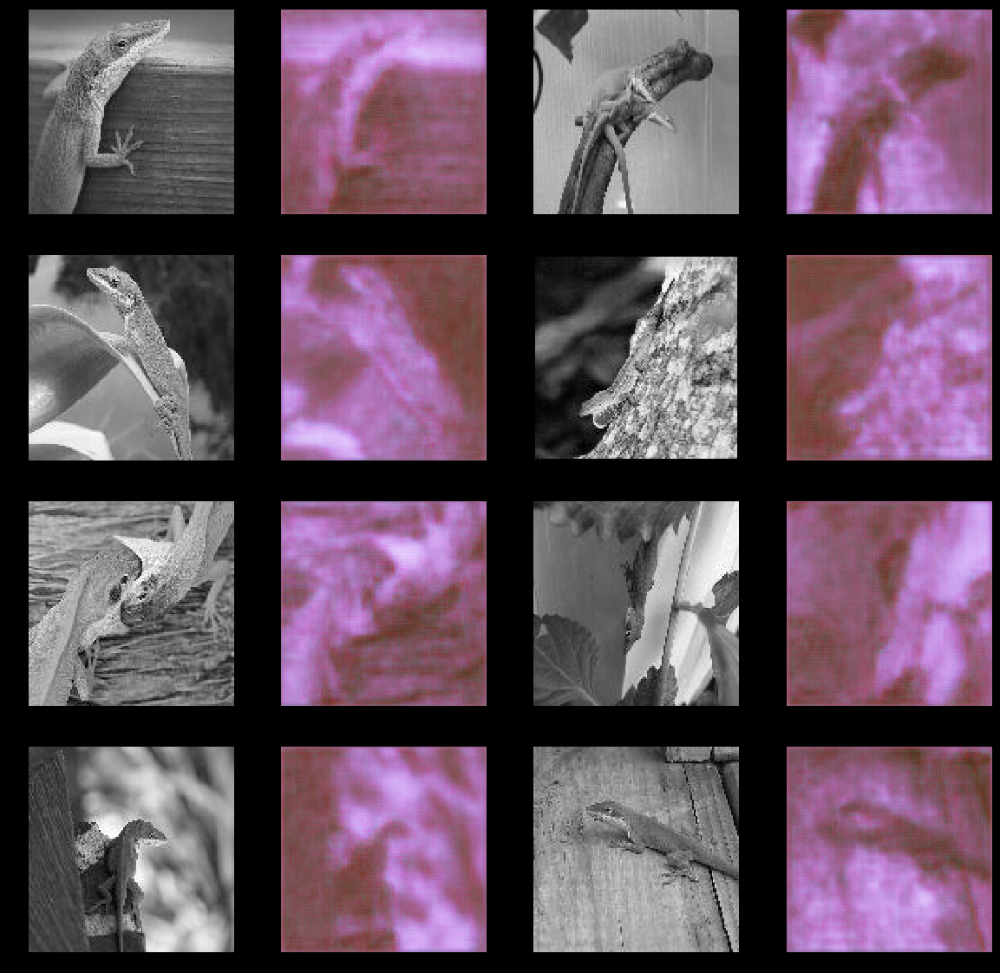

  3%|▎         | 2550/79264 [31:45<15:06:57,  1.41it/s]
WDist -4870.029296875; GPenalty 4.339118480682373; RScore 2538.64111328125; FScore -2331.388427734375; GLoss 3855.50732421875
  3%|▎         | 2600/79264 [32:22<15:05:05,  1.41it/s]
WDist -4990.0380859375; GPenalty 5.851850509643555; RScore 2601.0390625; FScore -2388.998779296875; GLoss 3552.947265625
  3%|▎         | 2650/79264 [32:59<15:04:34,  1.41it/s]
WDist -5110.6669921875; GPenalty 1.2521201372146606; RScore 2664.111328125; FScore -2446.5556640625; GLoss 3672.76708984375
  3%|▎         | 2700/79264 [33:37<15:05:16,  1.41it/s]
WDist -5231.66357421875; GPenalty 0.5290817022323608; RScore 2729.48388671875; FScore -2502.1796875; GLoss 3740.323486328125
  3%|▎         | 2750/79264 [34:14<15:07:28,  1.41it/s]
WDist -5355.166015625; GPenalty 3.2779085636138916; RScore 2792.09521484375; FScore -2563.070556640625; GLoss 3732.552734375
  4%|▎         | 2800/79264 [34:54<21:02:55,  1.01it/s]
WDist -5035.89990234375; GPenalty 1218.4187

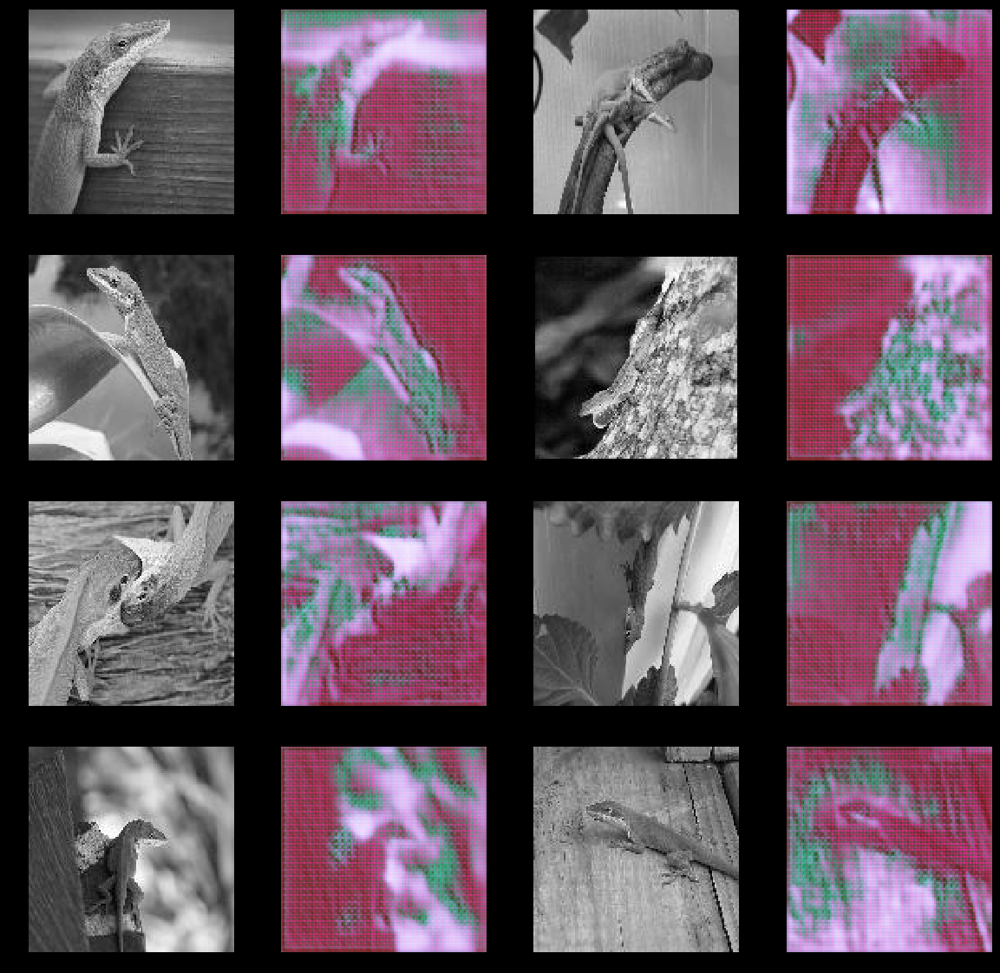

  4%|▍         | 3050/79264 [38:23<15:00:37,  1.41it/s]
WDist -5847.2724609375; GPenalty 374.4613342285156; RScore 3060.837890625; FScore -2786.434326171875; GLoss 4311.6923828125
  4%|▍         | 3100/79264 [39:02<15:03:46,  1.40it/s]
WDist -5692.1748046875; GPenalty 635.9724731445312; RScore 3134.3193359375; FScore -2557.855224609375; GLoss 4192.27685546875
  4%|▍         | 3150/79264 [39:39<15:01:16,  1.41it/s]
WDist -6102.6669921875; GPenalty 267.05157470703125; RScore 3167.4052734375; FScore -2935.26171875; GLoss 4323.0986328125
  4%|▍         | 3200/79264 [40:19<20:20:08,  1.04it/s]
WDist -5451.2685546875; GPenalty 426.6766357421875; RScore 2613.845947265625; FScore -2837.422607421875; GLoss 4215.5556640625
  4%|▍         | 3250/79264 [40:56<14:56:59,  1.41it/s]
WDist -6113.0087890625; GPenalty 344.67913818359375; RScore 3141.745849609375; FScore -2971.2626953125; GLoss 4354.33203125
  4%|▍         | 3300/79264 [41:33<14:56:48,  1.41it/s]
WDist -6351.359375; GPenalty 274.02996826

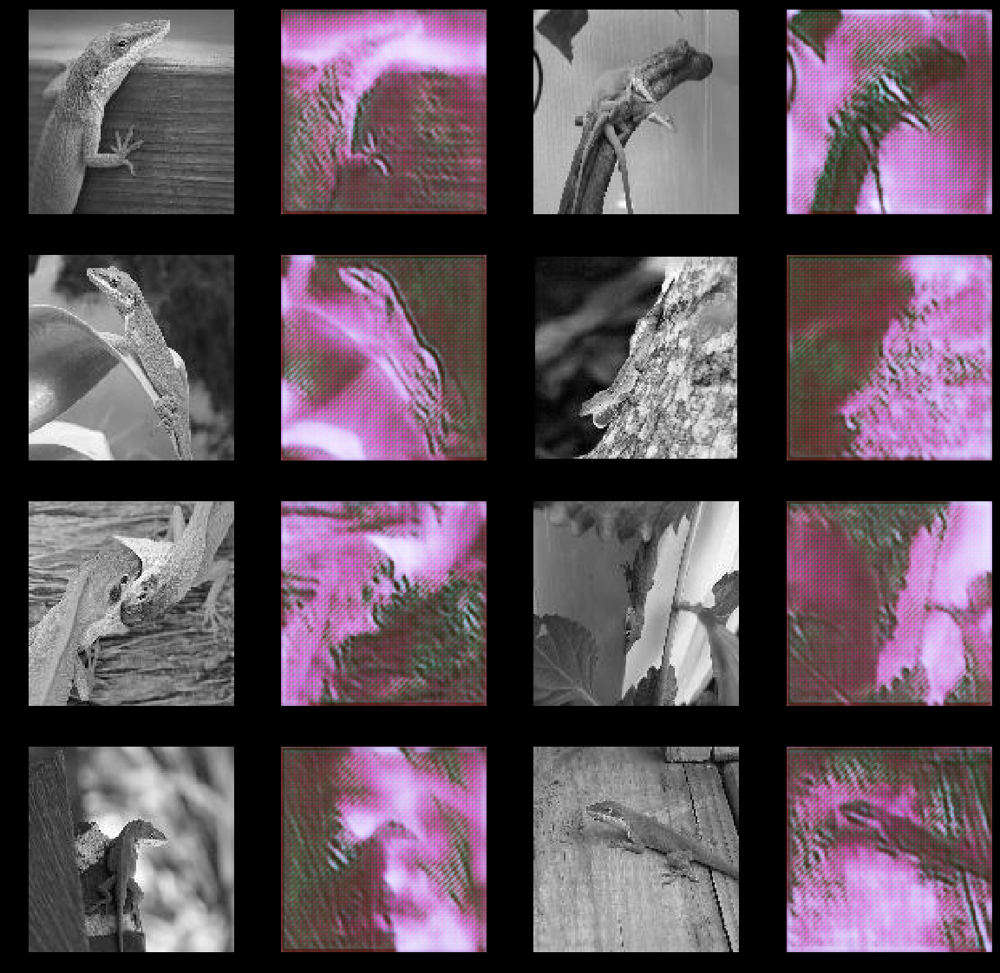

  4%|▍         | 3550/79264 [44:46<14:57:41,  1.41it/s]
WDist -6653.0185546875; GPenalty 467.25445556640625; RScore 3741.05126953125; FScore -2911.967041015625; GLoss 4792.7392578125
  5%|▍         | 3600/79264 [45:26<20:41:45,  1.02it/s]
WDist -7080.564453125; GPenalty 580.0459594726562; RScore 3742.15283203125; FScore -3338.411376953125; GLoss 4510.388671875
  5%|▍         | 3650/79264 [46:03<14:55:01,  1.41it/s]
WDist -3503.1630859375; GPenalty 119.20113372802734; RScore 3229.2314453125; FScore -273.93170166015625; GLoss 2717.41259765625
  5%|▍         | 3700/79264 [46:40<14:55:25,  1.41it/s]
WDist -6764.28271484375; GPenalty 328.09136962890625; RScore 3941.04833984375; FScore -2823.234375; GLoss 4918.08984375
  5%|▍         | 3750/79264 [47:18<14:54:19,  1.41it/s]
WDist -7272.79296875; GPenalty 413.799072265625; RScore 3945.763916015625; FScore -3327.029052734375; GLoss 4544.13623046875
  5%|▍         | 3800/79264 [47:55<14:51:44,  1.41it/s]
WDist -7672.03857421875; GPenalty 600.42

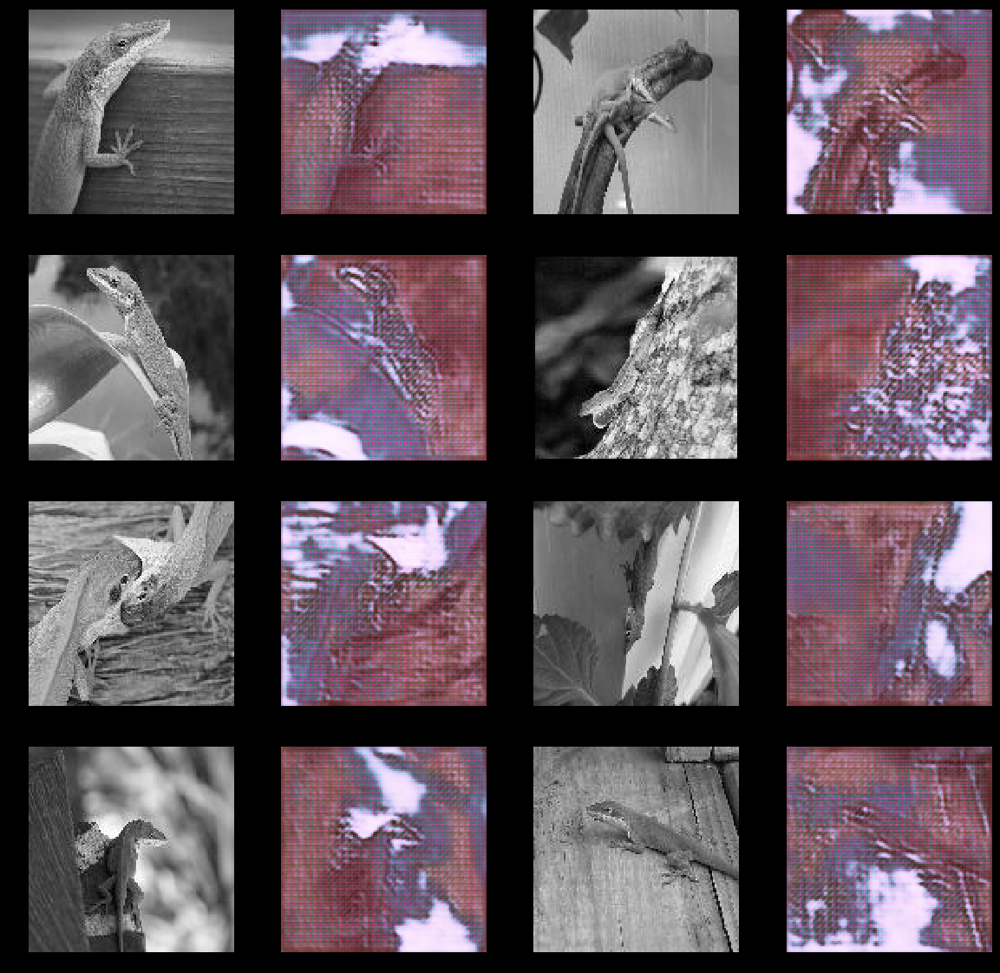

  5%|▌         | 4050/79264 [51:14<14:49:41,  1.41it/s]
WDist -7524.69482421875; GPenalty 1984.0635986328125; RScore 3851.607666015625; FScore -3673.087158203125; GLoss 3916.34521484375
  5%|▌         | 4100/79264 [51:51<14:51:35,  1.41it/s]
WDist -7498.0517578125; GPenalty 1350.74072265625; RScore 4128.67529296875; FScore -3369.376220703125; GLoss 4466.50634765625
  5%|▌         | 4150/79264 [52:31<14:49:39,  1.41it/s]
WDist -4513.78564453125; GPenalty 994.911865234375; RScore 1603.04443359375; FScore -2910.7412109375; GLoss 5818.74462890625
  5%|▌         | 4200/79264 [53:08<14:46:40,  1.41it/s]
WDist -8430.890625; GPenalty 915.9518432617188; RScore 4524.6103515625; FScore -3906.28076171875; GLoss 5550.62109375
  5%|▌         | 4250/79264 [53:45<14:49:22,  1.41it/s]
WDist -6964.5029296875; GPenalty 580.8475341796875; RScore 2721.200439453125; FScore -4243.302734375; GLoss 4795.447265625
  5%|▌         | 4300/79264 [54:25<14:47:15,  1.41it/s]
WDist -5669.6875; GPenalty 1289.8248291015

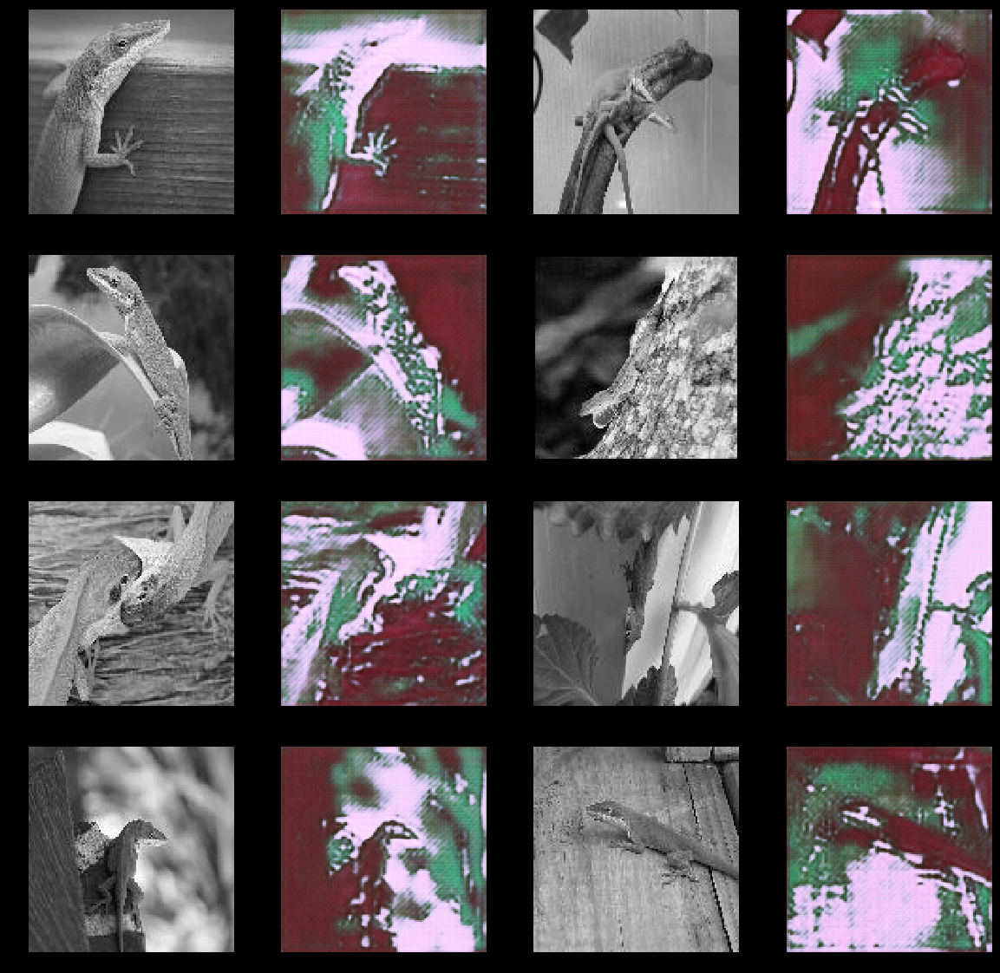

  6%|▌         | 4550/79264 [58:08<14:43:40,  1.41it/s]
WDist -4504.6865234375; GPenalty 562.157958984375; RScore 3331.53125; FScore -1173.155517578125; GLoss 2588.9697265625
  6%|▌         | 4600/79264 [58:45<14:42:03,  1.41it/s]
WDist -6429.45556640625; GPenalty 2440.6796875; RScore 4401.93701171875; FScore -2027.5185546875; GLoss 5783.279296875
  6%|▌         | 4650/79264 [59:22<14:45:45,  1.40it/s]
WDist -7203.7470703125; GPenalty 814.5764770507812; RScore 3330.302490234375; FScore -3873.44482421875; GLoss 4386.36669921875
  6%|▌         | 4700/79264 [1:00:01<14:42:57,  1.41it/s]
WDist -4591.439453125; GPenalty 730.7503662109375; RScore 725.6973876953125; FScore -3865.7421875; GLoss 4666.10693359375
  6%|▌         | 4750/79264 [1:00:38<14:41:14,  1.41it/s]
WDist -4334.85107421875; GPenalty 550.1995239257812; RScore 761.75341796875; FScore -3573.09765625; GLoss 4936.0595703125
  6%|▌         | 4800/79264 [1:01:16<17:01:27,  1.21it/s]
WDist -8066.49609375; GPenalty 2425.670654296875;

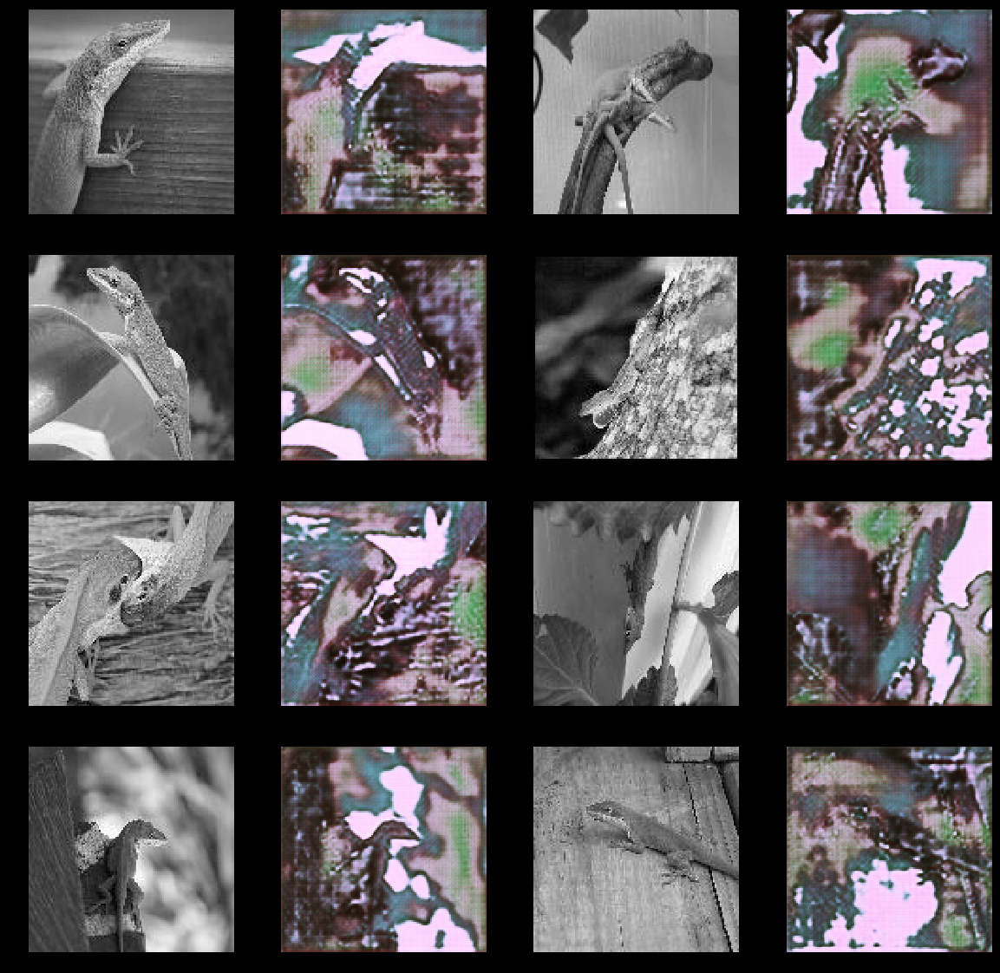

  6%|▋         | 5050/79264 [1:04:51<14:36:03,  1.41it/s]
WDist -8527.525390625; GPenalty 2597.899169921875; RScore 5254.47607421875; FScore -3273.049072265625; GLoss 6339.2880859375
  6%|▋         | 5100/79264 [1:05:29<14:39:04,  1.41it/s]
WDist -4594.33984375; GPenalty 1104.7325439453125; RScore 358.94732666015625; FScore -4235.392578125; GLoss 5442.4365234375
  6%|▋         | 5150/79264 [1:06:06<14:38:19,  1.41it/s]
WDist -7462.63916015625; GPenalty 3513.53271484375; RScore 4448.99267578125; FScore -3013.646484375; GLoss 5275.990234375
  7%|▋         | 5200/79264 [1:06:43<14:36:56,  1.41it/s]
WDist -6641.5498046875; GPenalty 1159.651611328125; RScore 3254.569091796875; FScore -3386.980712890625; GLoss 5662.01123046875
  7%|▋         | 5250/79264 [1:07:21<14:34:39,  1.41it/s]
WDist -9684.12890625; GPenalty 2508.70703125; RScore 4976.4423828125; FScore -4707.68603515625; GLoss 6322.15576171875
  7%|▋         | 5300/79264 [1:07:58<14:34:51,  1.41it/s]
WDist -4205.736328125; GPenalty 93

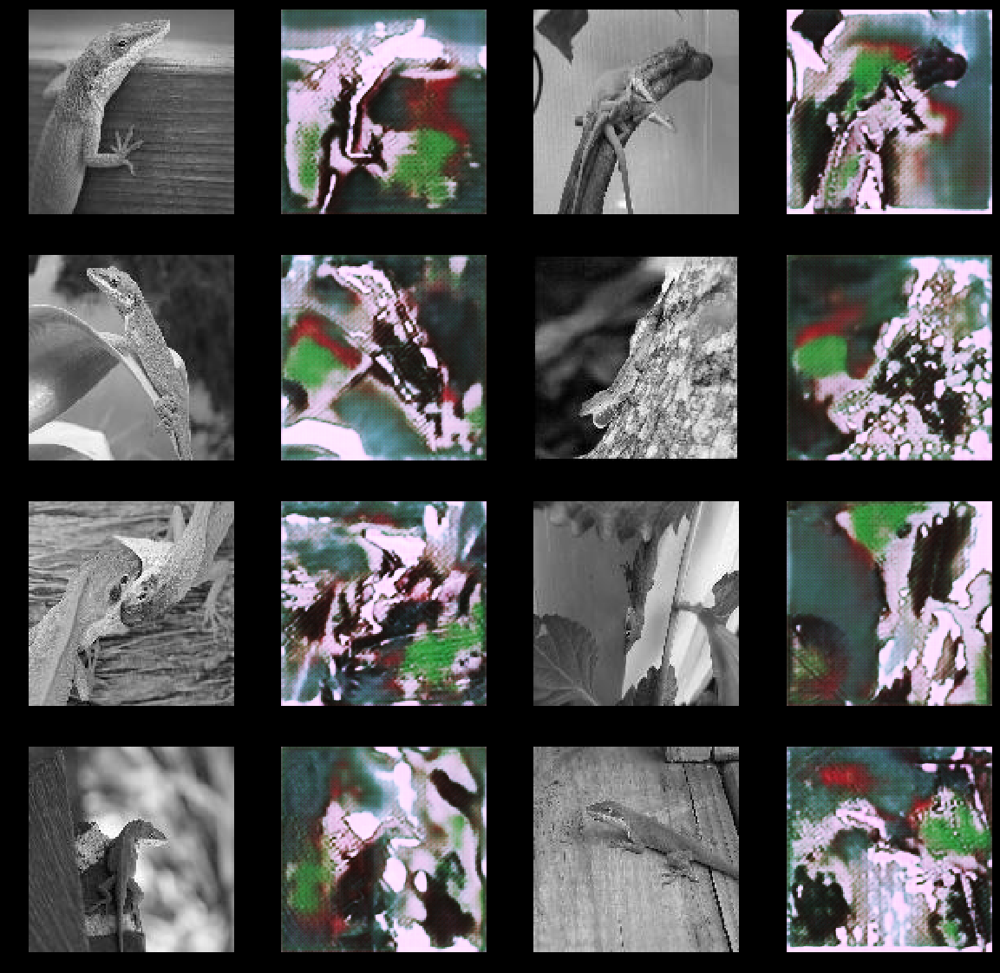

  7%|▋         | 5550/79264 [1:11:58<14:29:50,  1.41it/s]
WDist -2993.86083984375; GPenalty 451.56781005859375; RScore -1752.4876708984375; FScore -4746.3486328125; GLoss 6442.9755859375
  7%|▋         | 5600/79264 [1:12:35<14:31:02,  1.41it/s]
WDist -6627.025390625; GPenalty 2782.748779296875; RScore 2087.103759765625; FScore -4539.921875; GLoss 6008.125
  7%|▋         | 5650/79264 [1:13:14<14:29:29,  1.41it/s]
WDist -4664.7265625; GPenalty 1074.8616943359375; RScore 584.9213256835938; FScore -4079.80517578125; GLoss 4966.69482421875
  7%|▋         | 5700/79264 [1:13:51<14:28:32,  1.41it/s]
WDist -5117.0556640625; GPenalty 883.5955200195312; RScore 1426.631591796875; FScore -3690.424072265625; GLoss 5261.9384765625
  7%|▋         | 5750/79264 [1:14:32<19:12:22,  1.06it/s]
WDist -3935.877197265625; GPenalty 1338.9879150390625; RScore -97.38435363769531; FScore -4033.261474609375; GLoss 5682.2158203125
  7%|▋         | 5800/79264 [1:15:09<14:28:26,  1.41it/s]
WDist -4818.6640625; GPenal

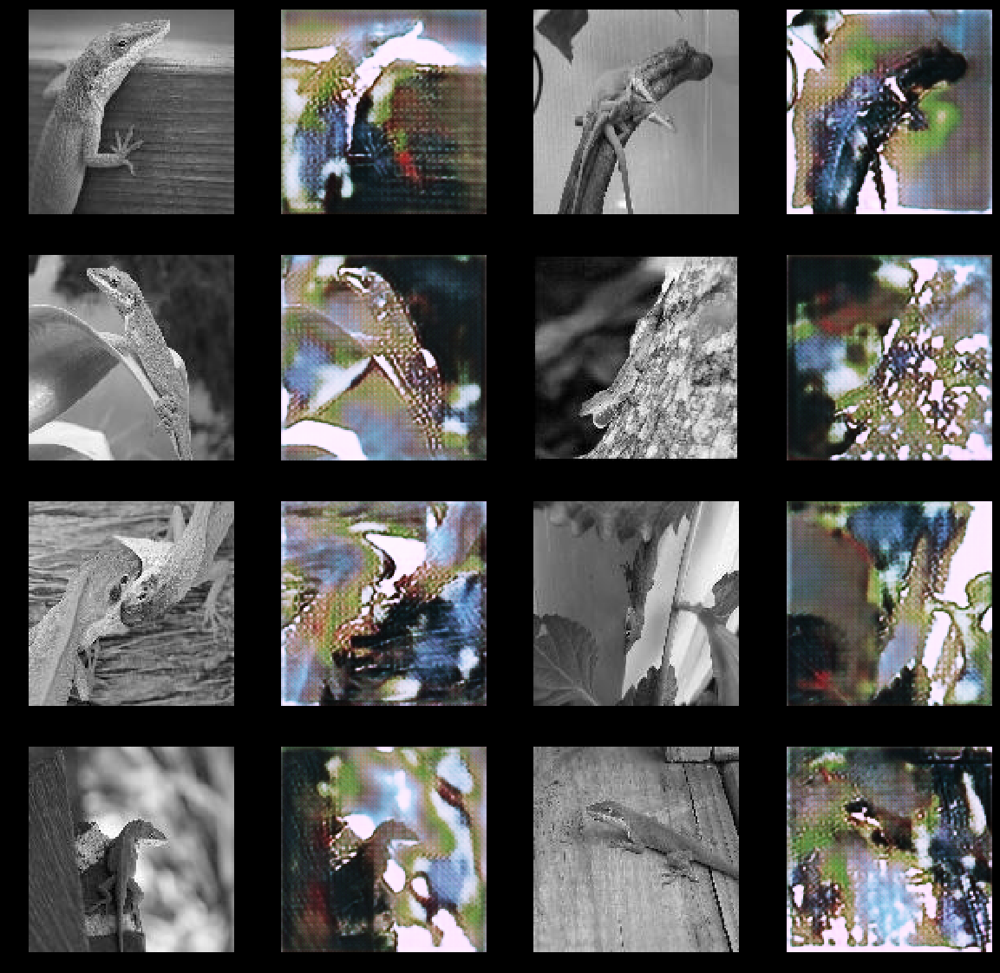

  8%|▊         | 6050/79264 [1:18:48<14:26:08,  1.41it/s]
WDist -3424.802001953125; GPenalty 1112.6368408203125; RScore 708.3969116210938; FScore -2716.405029296875; GLoss 3314.99267578125
  8%|▊         | 6100/79264 [1:19:25<14:24:36,  1.41it/s]
WDist -1395.391357421875; GPenalty 340.9427490234375; RScore -2786.498779296875; FScore -4181.89013671875; GLoss 5088.650390625
  8%|▊         | 6150/79264 [1:20:06<19:08:52,  1.06it/s]
WDist -3903.01416015625; GPenalty 794.6063232421875; RScore 26.894319534301758; FScore -3876.119873046875; GLoss 5593.61083984375
  8%|▊         | 6200/79264 [1:20:43<14:23:25,  1.41it/s]
WDist -1532.8651123046875; GPenalty 556.28125; RScore -842.9820556640625; FScore -2375.84716796875; GLoss 3977.85400390625
  8%|▊         | 6250/79264 [1:21:20<14:22:34,  1.41it/s]
WDist -4498.3330078125; GPenalty 863.2418212890625; RScore -576.5514526367188; FScore -5074.88427734375; GLoss 4811.10546875
  8%|▊         | 6300/79264 [1:22:01<14:24:19,  1.41it/s]
WDist -5383.142

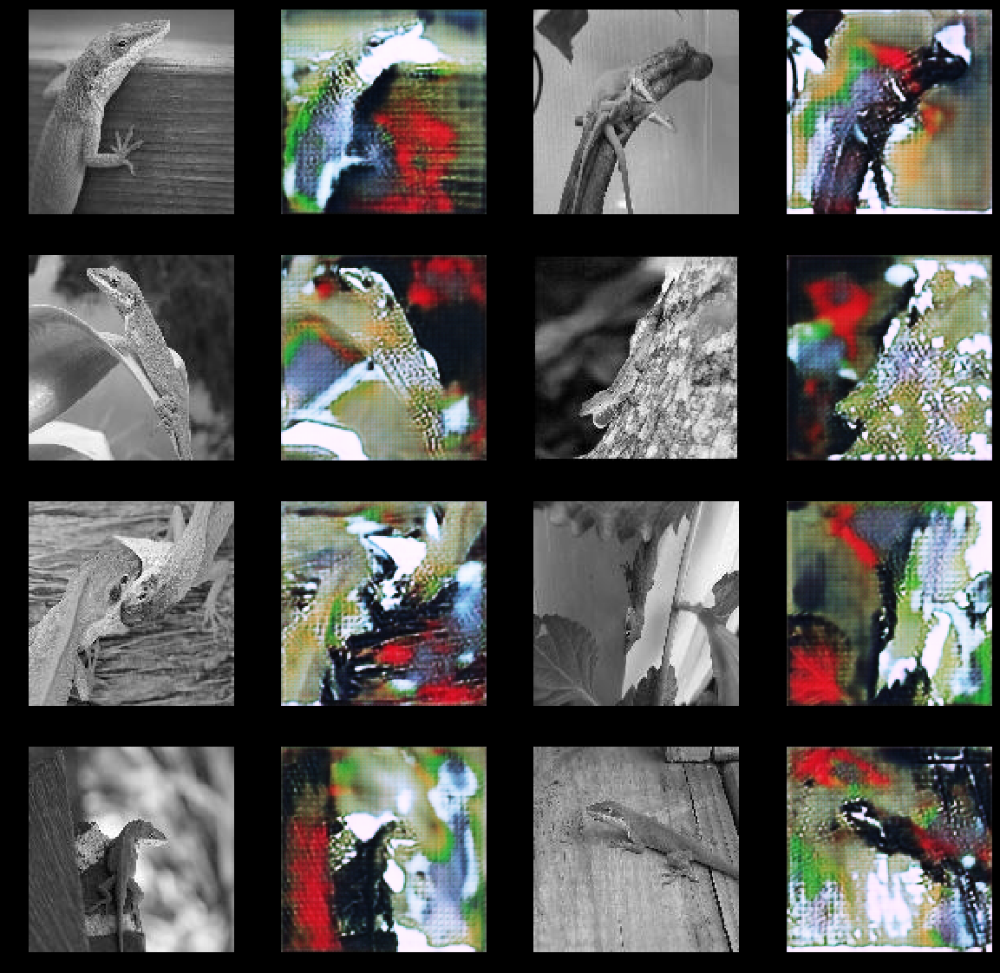

  8%|▊         | 6550/79264 [1:25:21<23:12:56,  1.15s/it]
WDist -1238.2886962890625; GPenalty 312.2581787109375; RScore -1814.4322509765625; FScore -3052.720947265625; GLoss 4344.41650390625
  8%|▊         | 6600/79264 [1:25:58<14:19:27,  1.41it/s]
WDist -2481.18212890625; GPenalty 394.0814514160156; RScore 215.64749145507812; FScore -2265.53466796875; GLoss 4465.22021484375
  8%|▊         | 6650/79264 [1:26:35<14:17:51,  1.41it/s]
WDist -1369.451904296875; GPenalty 317.6986389160156; RScore -1569.80419921875; FScore -2939.256103515625; GLoss 5365.4306640625
  8%|▊         | 6700/79264 [1:27:14<14:18:54,  1.41it/s]
WDist -5247.755859375; GPenalty 2486.0732421875; RScore 2558.055908203125; FScore -2689.7001953125; GLoss 7697.5048828125
  9%|▊         | 6750/79264 [1:27:51<14:16:19,  1.41it/s]
WDist -1431.937255859375; GPenalty 835.6004638671875; RScore -1214.28125; FScore -2646.218505859375; GLoss 5518.5458984375
  9%|▊         | 6800/79264 [1:28:28<14:15:12,  1.41it/s]
WDist -3869.1953

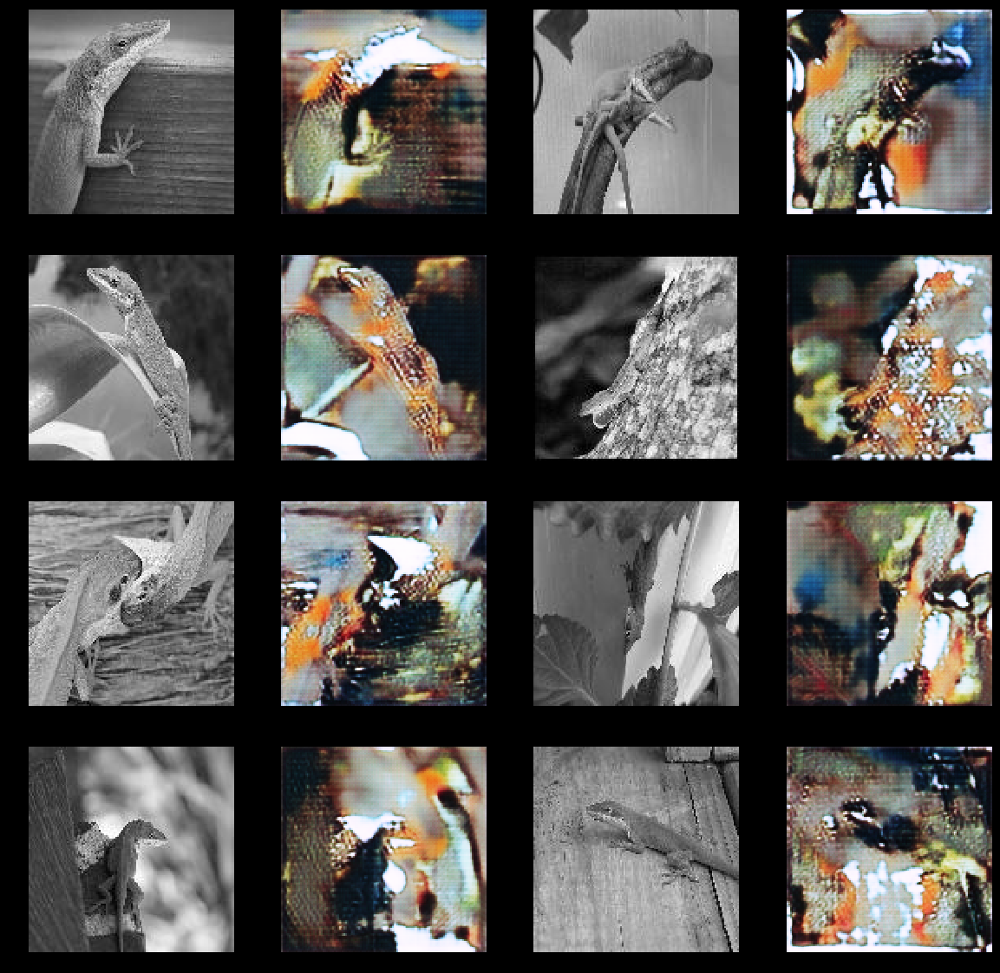

  9%|▉         | 7050/79264 [1:32:06<14:12:18,  1.41it/s]
WDist -1622.95556640625; GPenalty 409.66815185546875; RScore -3262.47998046875; FScore -4885.435546875; GLoss 5443.88671875
  9%|▉         | 7100/79264 [1:32:48<14:15:37,  1.41it/s]
WDist -3123.08349609375; GPenalty 1679.8509521484375; RScore -609.6119384765625; FScore -3732.695556640625; GLoss 7636.81689453125
  9%|▉         | 7150/79264 [1:33:25<14:14:12,  1.41it/s]
WDist -4500.5087890625; GPenalty 647.974609375; RScore 242.4810028076172; FScore -4258.02783203125; GLoss -1750.130126953125
  9%|▉         | 7200/79264 [1:34:02<14:13:47,  1.41it/s]
WDist -1406.41064453125; GPenalty 129.1869659423828; RScore -2753.580078125; FScore -4159.99072265625; GLoss 5563.10400390625
  9%|▉         | 7250/79264 [1:34:43<14:13:12,  1.41it/s]
WDist -7701.7236328125; GPenalty 1177.7344970703125; RScore 4014.371826171875; FScore -3687.3515625; GLoss 6825.4833984375
  9%|▉         | 7300/79264 [1:35:20<14:10:12,  1.41it/s]
WDist -147.5751953125; 

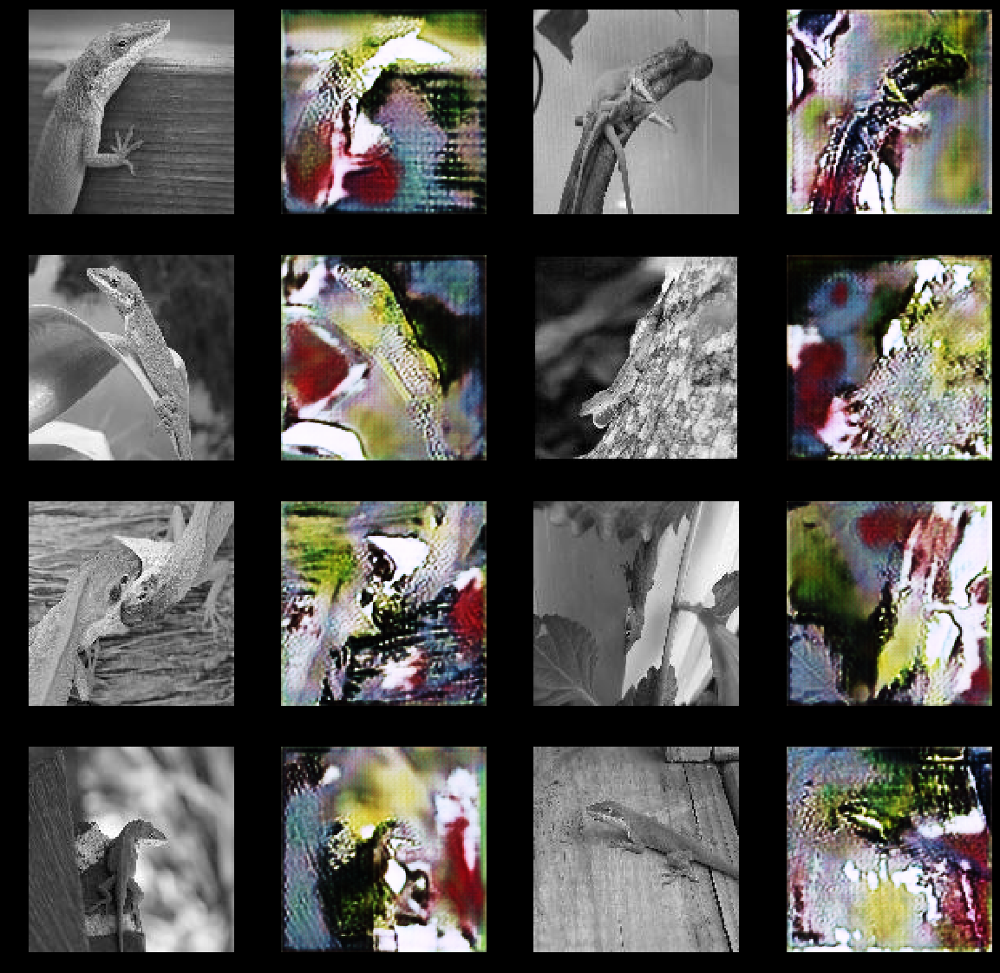

 10%|█         | 8050/79264 [1:45:16<14:02:56,  1.41it/s]
WDist -1490.0408935546875; GPenalty 339.88177490234375; RScore 246.2188720703125; FScore -1243.822021484375; GLoss 2699.97509765625
 10%|█         | 8100/79264 [1:45:53<13:59:47,  1.41it/s]
WDist -4277.15283203125; GPenalty 600.6515502929688; RScore -1386.0167236328125; FScore -5663.16943359375; GLoss 4131.86767578125
 10%|█         | 8150/79264 [1:46:30<14:00:26,  1.41it/s]
WDist -2796.8642578125; GPenalty 724.185302734375; RScore -1786.6641845703125; FScore -4583.5283203125; GLoss 5636.267578125
 10%|█         | 8200/79264 [1:47:14<13:58:46,  1.41it/s]
WDist -1970.379150390625; GPenalty 483.1929016113281; RScore -3195.877197265625; FScore -5166.25634765625; GLoss 7035.7685546875
 10%|█         | 8250/79264 [1:47:51<13:58:13,  1.41it/s]
WDist -2210.1083984375; GPenalty 411.06719970703125; RScore -2271.4453125; FScore -4481.5537109375; GLoss 5931.32373046875
 10%|█         | 8300/79264 [1:48:32<20:27:21,  1.04s/it]
WDist -2566.1

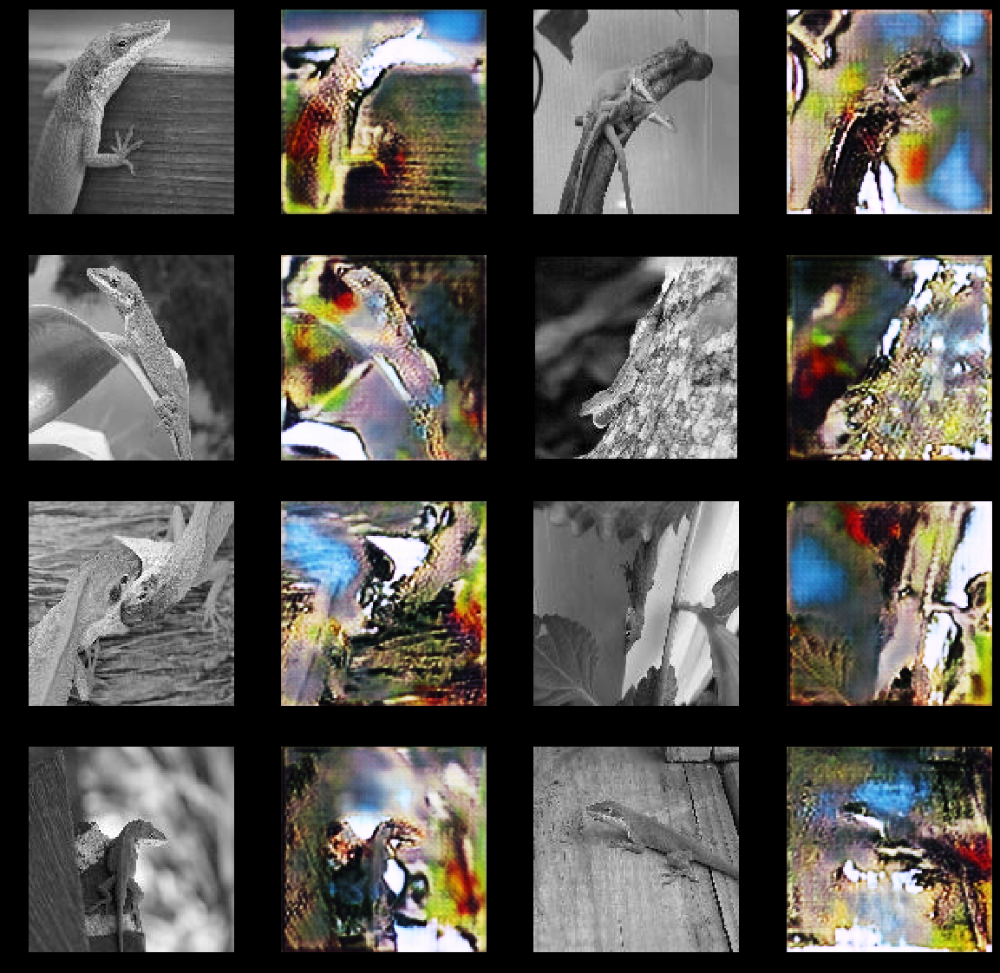

 11%|█         | 8550/79264 [1:51:43<13:57:39,  1.41it/s]
WDist -2899.4921875; GPenalty 1719.9854736328125; RScore -151.10604858398438; FScore -3050.59814453125; GLoss 7716.0263671875
 11%|█         | 8600/79264 [1:52:24<13:57:23,  1.41it/s]
WDist -5821.185546875; GPenalty 1281.30908203125; RScore 2973.989501953125; FScore -2847.196044921875; GLoss 5850.55224609375
 11%|█         | 8650/79264 [1:53:01<13:52:43,  1.41it/s]
WDist -1066.98681640625; GPenalty 146.68051147460938; RScore -4067.0712890625; FScore -5134.05810546875; GLoss 6706.43505859375
 11%|█         | 8700/79264 [1:53:43<19:55:23,  1.02s/it]
WDist -3699.0009765625; GPenalty 1306.9573974609375; RScore -102.05021667480469; FScore -3801.05126953125; GLoss 8300.736328125
 11%|█         | 8750/79264 [1:54:20<13:56:27,  1.41it/s]
WDist -7361.83837890625; GPenalty 1926.22119140625; RScore 3868.853759765625; FScore -3492.984619140625; GLoss 8026.4990234375
 11%|█         | 8800/79264 [1:54:57<13:54:08,  1.41it/s]
WDist -1058.77929

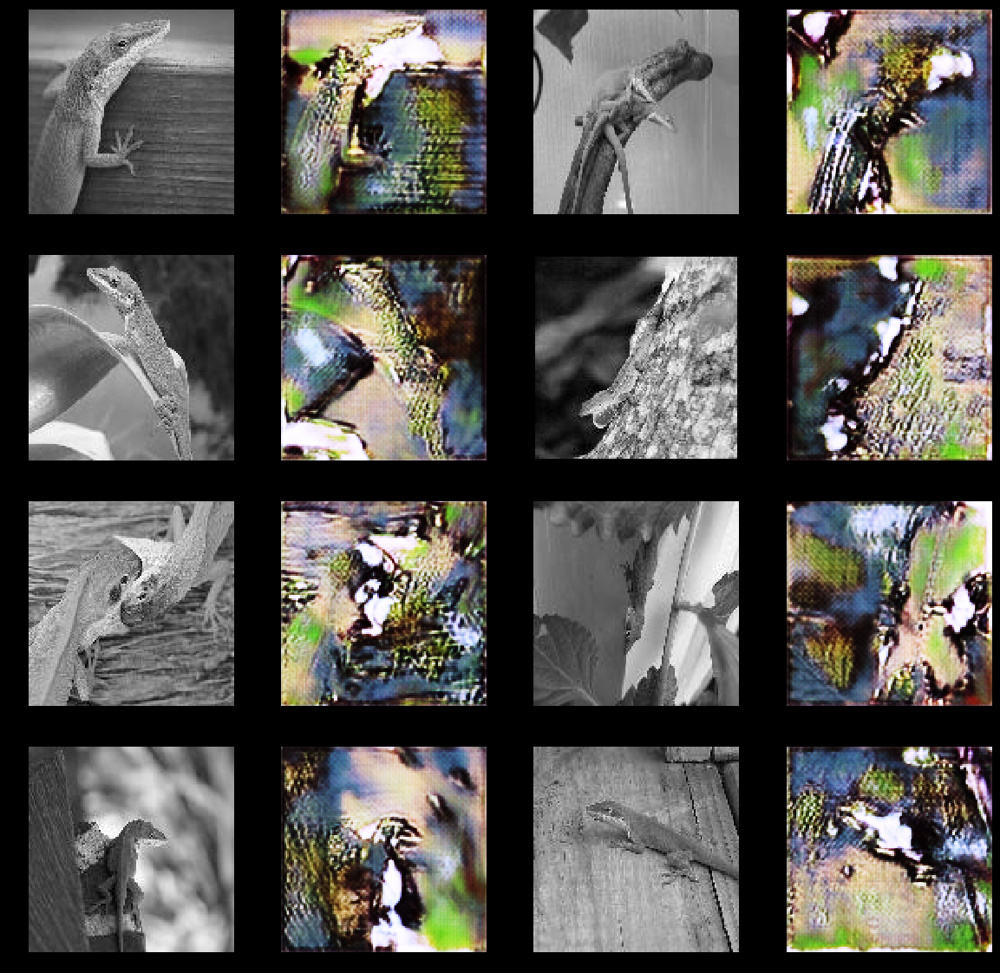

 11%|█▏        | 9050/79264 [1:58:47<13:48:33,  1.41it/s]
WDist -10279.607421875; GPenalty 831.3623657226562; RScore 5270.79541015625; FScore -5008.8115234375; GLoss 8203.45703125
 11%|█▏        | 9100/79264 [1:59:27<17:14:33,  1.13it/s]
WDist -5561.08837890625; GPenalty 1132.71630859375; RScore 814.2395629882812; FScore -4746.8486328125; GLoss 6971.60205078125
 12%|█▏        | 9150/79264 [2:00:04<13:48:10,  1.41it/s]
WDist -1521.80712890625; GPenalty 227.87503051757812; RScore -4280.43603515625; FScore -5802.2431640625; GLoss 8035.3046875
 12%|█▏        | 9200/79264 [2:00:41<13:48:25,  1.41it/s]
WDist -3320.644775390625; GPenalty 869.3529663085938; RScore -3174.995849609375; FScore -6495.640625; GLoss 6770.552734375
 12%|█▏        | 9250/79264 [2:01:19<13:47:54,  1.41it/s]
WDist -9308.162109375; GPenalty 1819.79248046875; RScore 4392.80078125; FScore -4915.36083984375; GLoss 8408.7099609375
 12%|█▏        | 9300/79264 [2:01:56<13:45:59,  1.41it/s]
WDist -1445.9091796875; GPenalty 428.

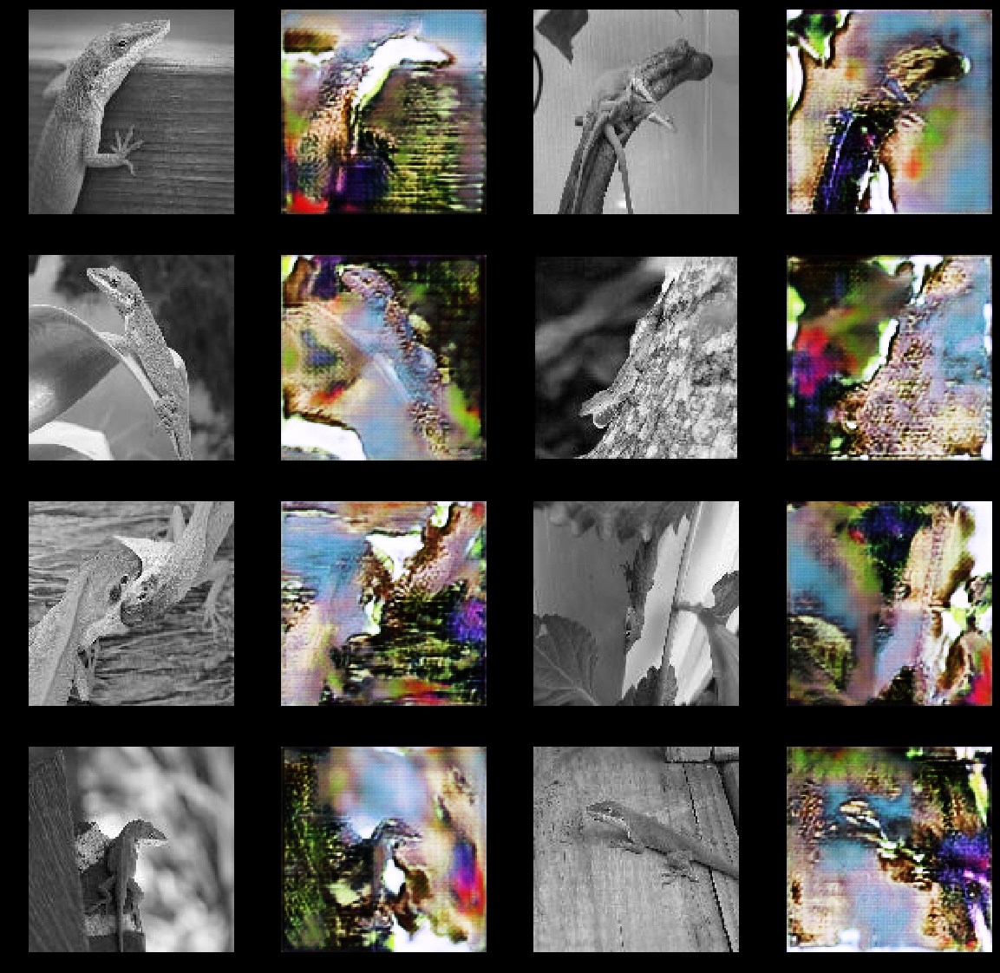

 12%|█▏        | 9550/79264 [2:05:43<13:47:23,  1.40it/s]
WDist -3285.499755859375; GPenalty 889.3812255859375; RScore -861.489990234375; FScore -4146.98974609375; GLoss 5505.06298828125
 12%|█▏        | 9600/79264 [2:06:20<13:44:20,  1.41it/s]
WDist -2243.05859375; GPenalty 853.7464599609375; RScore -3292.43359375; FScore -5535.4921875; GLoss 7045.23388671875
 12%|█▏        | 9650/79264 [2:07:01<13:44:17,  1.41it/s]
WDist -2391.262451171875; GPenalty 541.7086791992188; RScore -2244.104248046875; FScore -4635.36669921875; GLoss 5783.1455078125
 12%|█▏        | 9700/79264 [2:07:38<13:42:18,  1.41it/s]
WDist -6106.7197265625; GPenalty 1092.7772216796875; RScore -896.440185546875; FScore -7003.15966796875; GLoss 7997.16015625
 12%|█▏        | 9750/79264 [2:08:15<13:43:12,  1.41it/s]
WDist -5307.37841796875; GPenalty 1158.277587890625; RScore 226.9213409423828; FScore -5080.45703125; GLoss 8146.79296875
 12%|█▏        | 9800/79264 [2:08:55<13:42:52,  1.41it/s]
WDist -4838.10009765625; GPen

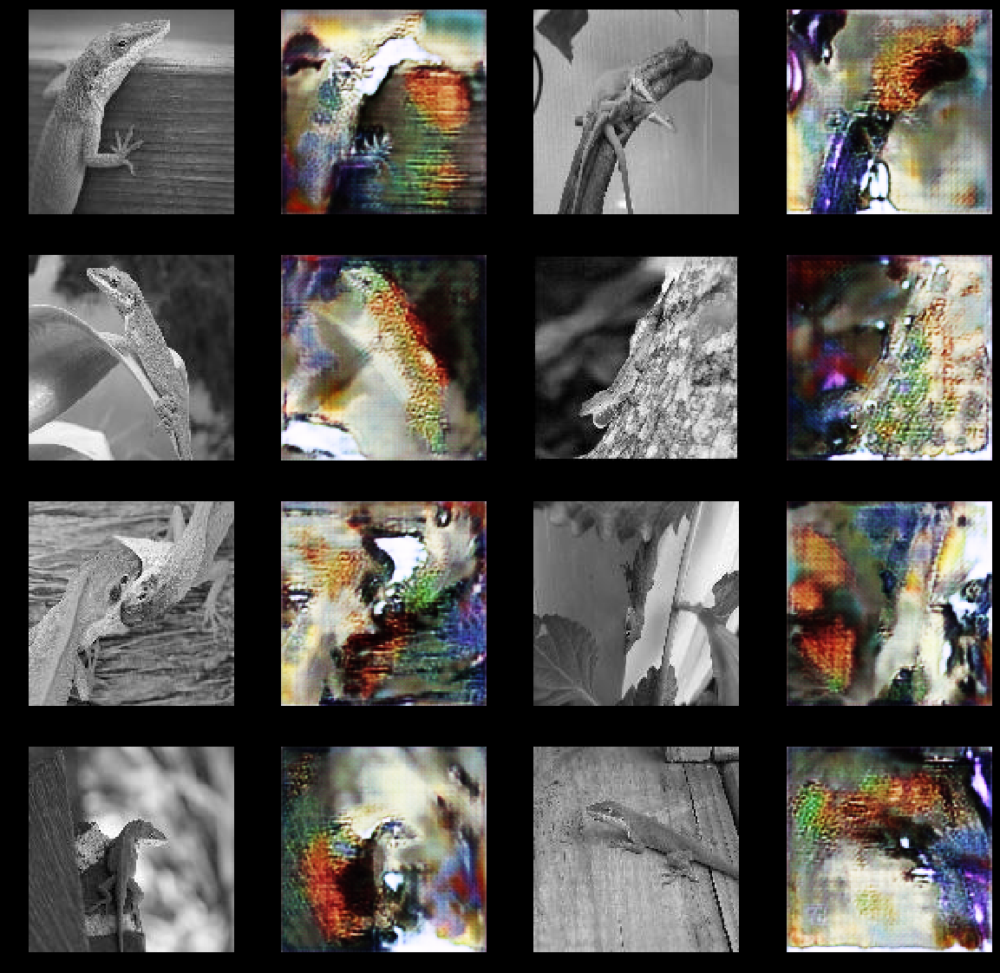

 13%|█▎        | 10050/79264 [2:12:29<13:37:40,  1.41it/s]
WDist -1129.59716796875; GPenalty 322.03594970703125; RScore -4264.16259765625; FScore -5393.759765625; GLoss 6750.9765625
 13%|█▎        | 10200/79264 [2:14:16<13:36:09,  1.41it/s]
WDist -2738.4423828125; GPenalty 930.2286376953125; RScore -3778.2080078125; FScore -6516.650390625; GLoss 8480.056640625
 13%|█▎        | 10250/79264 [2:14:53<13:35:32,  1.41it/s]
WDist -9103.0087890625; GPenalty 5983.36181640625; RScore 6294.22314453125; FScore -2808.785888671875; GLoss 8948.427734375
 13%|█▎        | 10300/79264 [2:15:30<13:34:31,  1.41it/s]
WDist -1961.94580078125; GPenalty 357.089111328125; RScore -4065.7626953125; FScore -6027.70849609375; GLoss 7648.0517578125
 13%|█▎        | 10350/79264 [2:16:08<13:36:31,  1.41it/s]
WDist -5777.1181640625; GPenalty 994.4327392578125; RScore -1064.5802001953125; FScore -6841.6982421875; GLoss 4871.7421875
 13%|█▎        | 10400/79264 [2:16:45<13:35:23,  1.41it/s]
WDist -10142.865234375; GPen

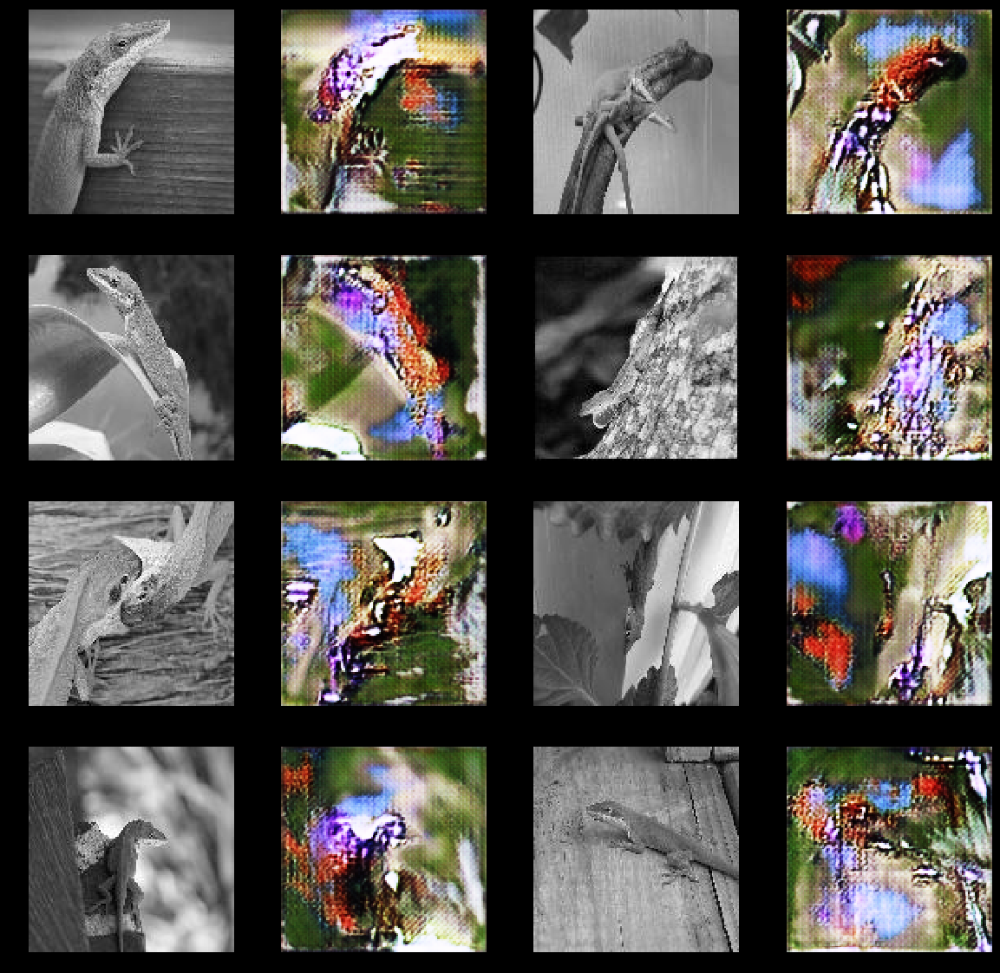

 13%|█▎        | 10550/79264 [2:19:09<13:33:46,  1.41it/s]
WDist -5898.92626953125; GPenalty 1847.4130859375; RScore 915.7923583984375; FScore -4983.1337890625; GLoss 8078.9208984375
 13%|█▎        | 10600/79264 [2:19:48<13:33:03,  1.41it/s]
WDist -5562.06201171875; GPenalty 1308.1287841796875; RScore 1350.8836669921875; FScore -4211.17822265625; GLoss 6156.53759765625
 13%|█▎        | 10650/79264 [2:20:26<13:31:30,  1.41it/s]
WDist -372.26123046875; GPenalty 253.69952392578125; RScore -5943.33740234375; FScore -6315.5986328125; GLoss 7782.31201171875
 13%|█▎        | 10700/79264 [2:21:03<13:31:23,  1.41it/s]
WDist -665.70361328125; GPenalty 587.6492309570312; RScore -6425.548828125; FScore -7091.25244140625; GLoss 9202.01171875
 14%|█▎        | 10750/79264 [2:21:42<13:31:40,  1.41it/s]
WDist -4413.40966796875; GPenalty 616.756103515625; RScore -1608.0736083984375; FScore -6021.4833984375; GLoss 6707.845703125
 14%|█▎        | 10800/79264 [2:22:19<13:30:05,  1.41it/s]
WDist -8384.40136

/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


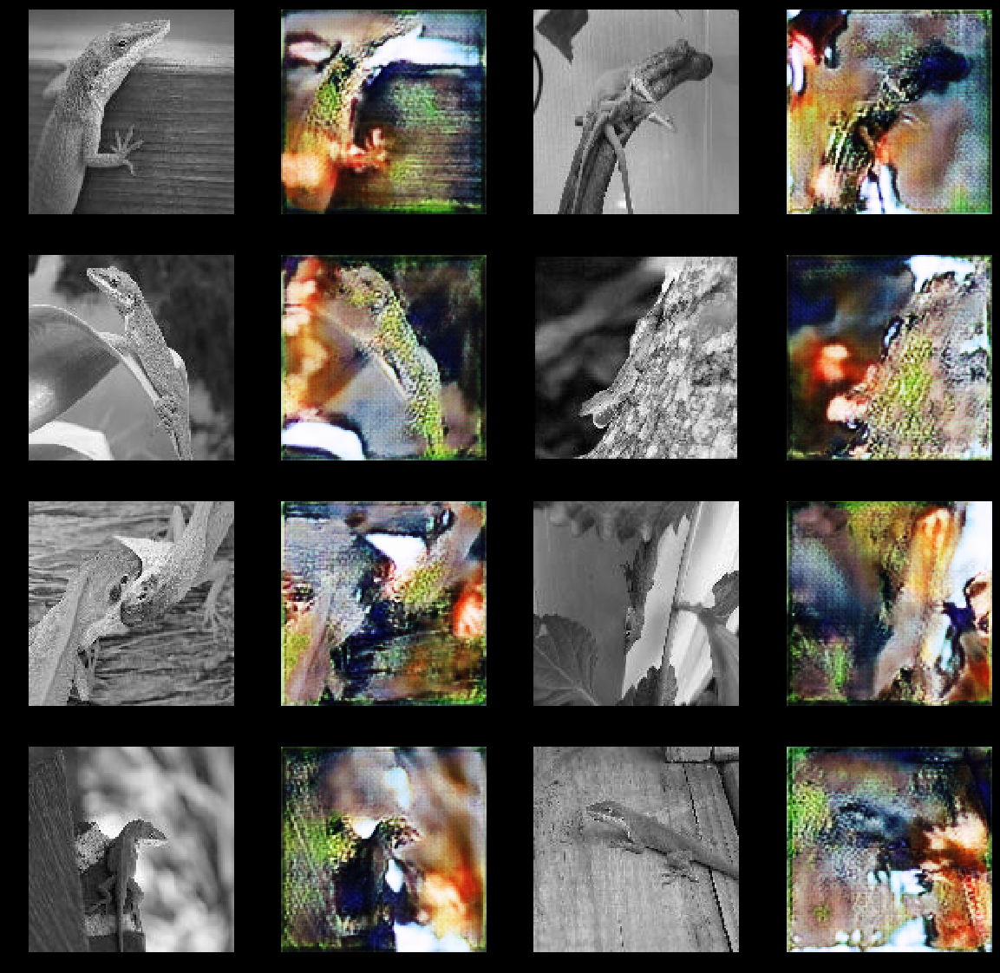

 14%|█▍        | 11050/79264 [2:25:31<13:27:51,  1.41it/s]
WDist -6408.087890625; GPenalty 1537.630126953125; RScore 1651.7340087890625; FScore -4756.35400390625; GLoss 6830.72705078125
 14%|█▍        | 11100/79264 [2:26:08<13:26:26,  1.41it/s]
WDist -6373.7275390625; GPenalty 940.726318359375; RScore 1113.0584716796875; FScore -5260.6689453125; GLoss 5986.654296875
 14%|█▍        | 11150/79264 [2:26:48<13:25:38,  1.41it/s]
WDist -5133.115234375; GPenalty 1230.93017578125; RScore -1184.8885498046875; FScore -6318.00390625; GLoss 9352.515625
 14%|█▍        | 11200/79264 [2:27:25<13:26:11,  1.41it/s]
WDist -3772.251953125; GPenalty 1356.172119140625; RScore -63.50917434692383; FScore -3835.76123046875; GLoss 5262.009765625
 14%|█▍        | 11250/79264 [2:28:04<15:47:40,  1.20it/s]
WDist -6330.58056640625; GPenalty 1785.0023193359375; RScore -281.01763916015625; FScore -6611.59814453125; GLoss 3233.441162109375
 14%|█▍        | 11300/79264 [2:28:41<13:22:37,  1.41it/s]
WDist -599.69299316

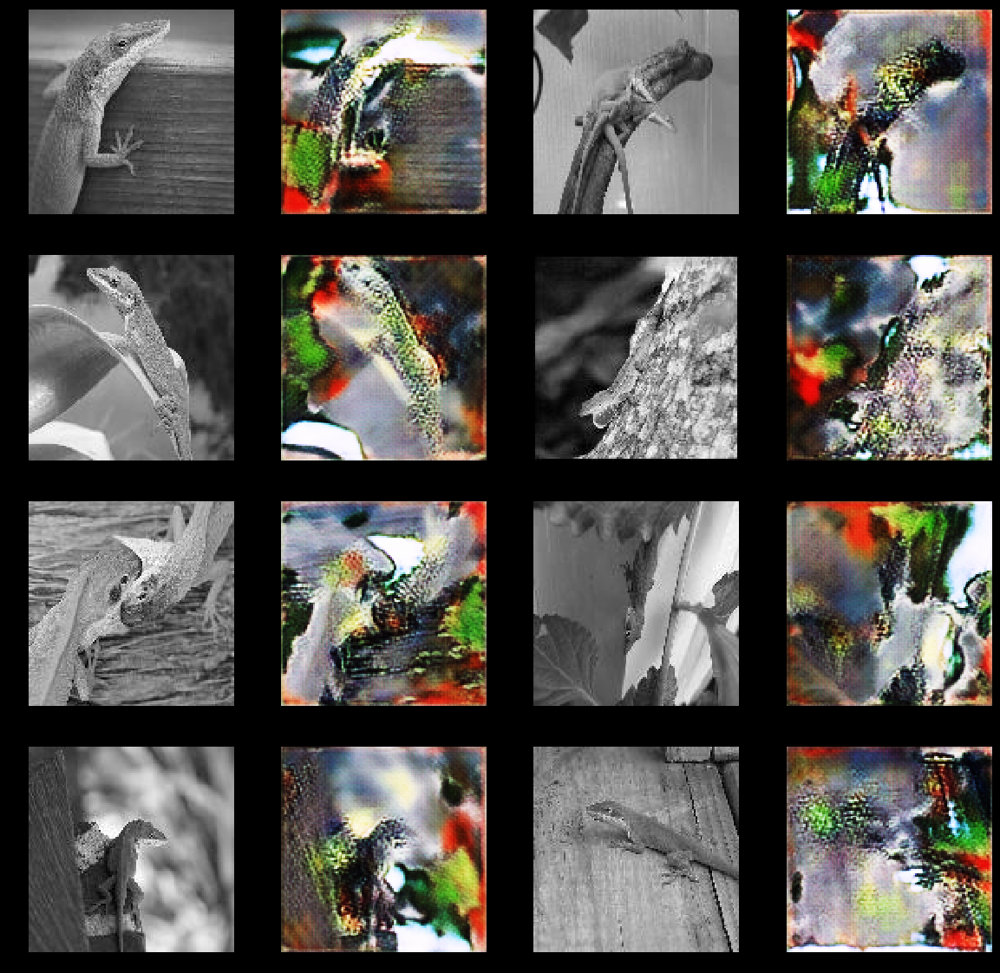

 15%|█▍        | 11550/79264 [2:31:57<13:20:46,  1.41it/s]
WDist -803.9423828125; GPenalty 209.91281127929688; RScore -7937.673828125; FScore -8741.6162109375; GLoss 10052.8759765625
 15%|█▍        | 11600/79264 [2:32:34<13:20:38,  1.41it/s]
WDist -3250.638671875; GPenalty 508.5638122558594; RScore -4414.93994140625; FScore -7665.57861328125; GLoss 7042.4951171875
 15%|█▍        | 11650/79264 [2:33:14<15:55:49,  1.18it/s]
WDist -4268.53076171875; GPenalty 655.1333618164062; RScore -972.0310668945312; FScore -5240.56201171875; GLoss 6425.4453125
 15%|█▍        | 11700/79264 [2:33:51<13:20:02,  1.41it/s]
WDist -658.3515625; GPenalty 55.92509460449219; RScore -5479.994140625; FScore -6138.345703125; GLoss 7449.0458984375
 15%|█▍        | 11750/79264 [2:34:28<13:16:44,  1.41it/s]
WDist -2233.616455078125; GPenalty 373.622802734375; RScore -3198.174072265625; FScore -5431.79052734375; GLoss 6536.23388671875
 15%|█▍        | 11800/79264 [2:35:10<13:17:18,  1.41it/s]
WDist -8813.8017578125; G

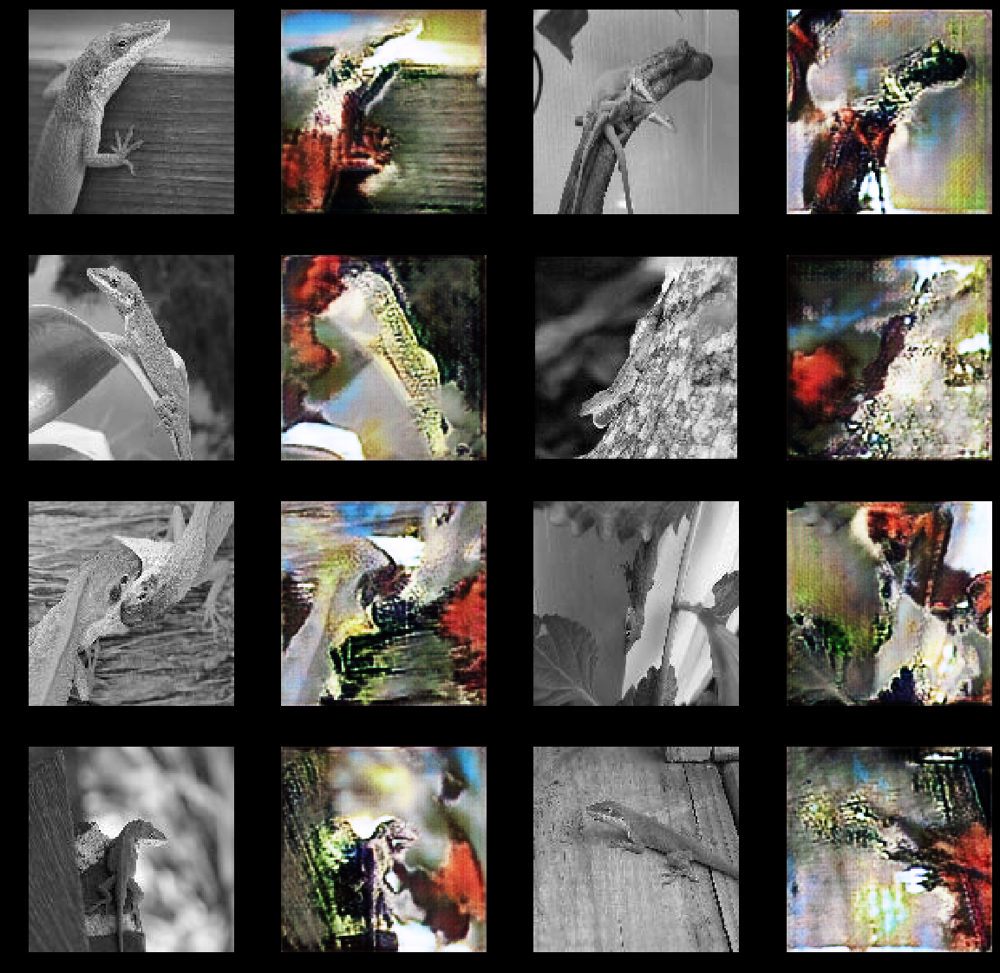

 15%|█▌        | 12002/79264 [2:37:55<58:52:25,  3.15s/it]

In [ ]:
train(1, True)
#train(1, False)

In [ ]:
train(9, False)